# Analysis of music data from Spotify and Last.fm  

The following objectives are the main focus in this notebook  
- Comparison of top music trends in between countries based on track attributes  
- Comparison of any two top artists based on the same track attributes
- Visualizing the distribution of artists, track attributes and genres in personal listening history
- Examine the possibility of predicting the artist or genre from the song attributes in a small dataset of tracks

In this project, music related information is collected from both the services (spotify and last.fm) using API methods. Spotipy is a custom library which was used to access spotify's API methods. For last.fm, the API methods were called directly.

***
### Part I: Initial preparation  
The important libraries are imported, and the keys necessary for making the API requests are stored in the respective files.  
***

In [1]:
import pandas as pd
import pickle
import os
import time
import math
import pycountry
import requests
import pprint as pp
import pydoc
import seaborn as sb
import json
import spotipy
import matplotlib.pyplot as plt
from spotipy.oauth2 import SpotifyClientCredentials

In [2]:
if not os.path.exists('API_keys_spotify.pkl'):
    keys = {}
    keys['API key'] = ''
    keys['secret key'] = ''
    keys['username'] = ''
    keys['password'] = ''
    with open('API_keys_spotify.pkl','wb') as f:
        pickle.dump(keys, f)
else:
    keys = pickle.load(open('API_keys_spotify.pkl','rb'))

In [3]:
if not os.path.exists('API_keys_lastfm.pkl'):
    lastfm = {}
    lastfm['API key'] = ''
    lastfm['secret key'] = ''
    lastfm['username'] = ''
    lastfm['password'] = ''
    with open('API_keys_lastfm.pkl','wb') as f:
        pickle.dump(lastfm, f)
else:
    lastfm = pickle.load(open('API_keys_lastfm.pkl','rb'))

In [4]:
credentials = spotipy.oauth2.SpotifyClientCredentials(client_id = keys['API key'], client_secret = keys['secret key'])

Later in the notebook if you get an error message about expiration of access token, simply rerun this code below

In [5]:
tokens = credentials.get_access_token(as_dict = False)
sp = spotipy.Spotify(tokens)

***
### Part II: Defining functions for the first two objectives of the assignment
It is necessary to define some functions to make the job of calling the API methods easier
***

**grab_artist(arg)**  returns the artist name and ID.   
The function argument is a string, which should be close to the artist name. E.g. if arg is 'beatles', the returned values are 'The Beatles' and the artist ID.

In [6]:
def grab_artist(artist):
    get = sp.search(artist, limit = 1, type = 'artist')
    grabbed = [(data['name'], data['id']) for data in get['artists']['items']]
    return grabbed

**grab_songs(arg)** returns the 10 most popular songs (and the song IDs) of an artist.  
The artist name is passed as the argument.

In [7]:
def grab_songs(artist):
    artist_id = grab_artist(artist)
    get = sp.artist_top_tracks(artist_id[0][1])
    grabbed =[(data['name'], data['id']) for data in get['tracks']]
    song_list = pd.DataFrame(grabbed, columns = [artist_id[0][0], 1])
    return song_list

**artist_traits(arg)** returns information on 5 selected music attributes - energy, acousticness, valence, danceability and tempo.  
The artist name is passed as argument. The returned values include -
 * the said attributes for each song
 * the mean of the attributes for each artist
 * the full artist name

In [8]:
def artist_traits(artist):
    songs = grab_songs(artist)
    IDs = songs[1]
    features = pd.DataFrame(sp.audio_features(IDs))
    filtered = features[['energy', 'acousticness', 'valence', 'danceability', 'tempo']]
    mean = filtered.mean()
    return filtered, mean, songs.columns[0]

**compare(arg)** is the main function for producing the necessary plots for comparisons between countries and artists.  
A list of artists is passed as the argument.
The function normally has no return values, and instead displays the following plots -  
* Scatter plots of all the artists in the arguments on the following pairs of axes
    - Happiness (valence) and Energy
    - Danceability and Tempo
    - Energy and Acousticness
* Bar charts comparing all the different artists in the arguments according to each of the song attributes separately. Bar charts are only produced if the total number of artists in arguments is 10 or less. ( _due to readability issues of such charts at higher bar numbers_ )

In [9]:
def compare(artist_list):
    a = []
    b = []
    c = []
    i = 0
    for item in artist_list:
        d, e, f = artist_traits(item)
        a.append(d)
        b.append(e)
        c.append(f)
        
    fig = plt.figure(figsize = (10,10))
    ax = fig.add_subplot(311)
    ax1 = fig.add_subplot(312)
    ax2 = fig.add_subplot(313)
    fig.tight_layout(pad=3.0)
    for i in range(len(a)):
        ax.scatter(a[i]['energy'], a[i]['valence'], label = c[i])
        ax.set_ylabel('Happiness', fontsize = 15)
        ax.set_xlabel('Energy', fontsize = 15)
        ax.set_xlim([0,1])
        ax.set_ylim([0,1])
        h,l = ax.get_legend_handles_labels()
        if len(h)<=5:
            ax.legend(h[:5], l[:5], loc = "upper left", facecolor = 'white')
        else:
            ax.legend(h[:5], l[:5], loc = "upper left", title = 'Top 5 artists', facecolor = 'white')
#         ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        
        ax1.scatter(a[i]['tempo'], a[i]['danceability'], label = c[i])
        ax1.set_ylabel('Danceability', fontsize = 15)
        ax1.set_xlabel('Tempo', fontsize = 15)
        ax1.set_xlim(xmin = 0)
        ax1.set_ylim([0,1])
        h,l = ax1.get_legend_handles_labels()
        if len(h)<=5:
            ax1.legend(h[:5], l[:5], loc = "upper left", facecolor = 'white')
        else:
            ax1.legend(h[:5], l[:5], loc = "upper left", title = 'Top 5 artists', facecolor = 'white')
        
        ax2.scatter(a[i]['acousticness'], a[i]['energy'], label = c[i])
        ax2.set_ylabel('Energy', fontsize = 15)
        ax2.set_xlabel('Acousticness', fontsize = 15)
        ax2.set_xlim([0,1])
        ax2.set_ylim([0,1])
        h,l = ax2.get_legend_handles_labels()
        if len(h)<=5:
            ax2.legend(h[:5], l[:5], loc = "upper right", facecolor = 'white')
        else:
            ax2.legend(h[:5], l[:5], loc = "upper right", title = 'Top 5 artists', facecolor = 'white')
#         ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
          
    
    if len(artist_list)>=5 and len(artist_list)<=10:
        fig1, bx = plt.subplots(5, figsize = (25,20))
    if len(artist_list)<=5:
        fig1, bx = plt.subplots(5, figsize = (10,20))
    if len(artist_list)<=10:
        fig1.tight_layout(pad=5.0)
        for j in range(len(b)):
            for k in range(len(b[j])):
                bx[k].bar(c[j], b[j][k])
                bx[k].grid(axis = 'y', zorder = 0)
                bx[k].set_axisbelow(True)
                bx[k].set_title(b[j].index[k], fontsize = 20)
                bx[k].tick_params(axis='both', which='major', labelsize=15)
    
#     return a, b, c      #you may uncomment this to see and explore the lists more

**lastfm_global(arg)** returns the top artists listened to globally.  
The number of artists to be returned is passed as argument.

In [10]:
def lastfm_global(number):
    fetch = {'method':'chart.getTopArtists'}
    headers = {'user':lastfm['username']}
    url = 'http://ws.audioscrobbler.com/2.0/'
    
    fetch['api_key'] = lastfm['API key']
    fetch['format'] = 'json'
    fetch['limit'] = number
    
    retrieve = requests.get(url, headers = headers, params = fetch)
    global_artists = retrieve.json()
    world_top_artists = [thing['name'] for thing in global_artists['artists']['artist']]
    return world_top_artists

**lastfm_country(args)** returns the top artists of a specified country.  
The country name (as string) and the number of artists to be returned are passed as arguments.

In [11]:
def lastfm_country(country_input, number):
    get_country = pycountry.countries.search_fuzzy(country_input)
    country = get_country[0].name
    
    fetch = {'method':'geo.getTopArtists'}
    headers = {'user':lastfm['username']}
    url = 'http://ws.audioscrobbler.com/2.0/'
    
    fetch['api_key'] = lastfm['API key']
    fetch['format'] = 'json'
    fetch['limit'] = number
    fetch['country'] = country
    
    retrieve = requests.get(url, headers = headers, params = fetch)
    countrys_artists = retrieve.json()
    country_top_artists = [thing['name'] for thing in countrys_artists['topartists']['artist']]
    return  country_top_artists

**user_artists()** accepts artist names as input and returns the artist list for use by the compare() function

In [12]:
def user_artists():
    artist_input = input("Enter the artists separated by commas - ")
    artists  = artist_input.split(",")
    return artists

***
### Part III: Visualization of data from Part II
***
Steps:
1. Call a function (any from user_artists(), lastfm_country(), user_artists()), and assign the returned values to a variable.  
2. Pass that variable through the compare() function as argument.


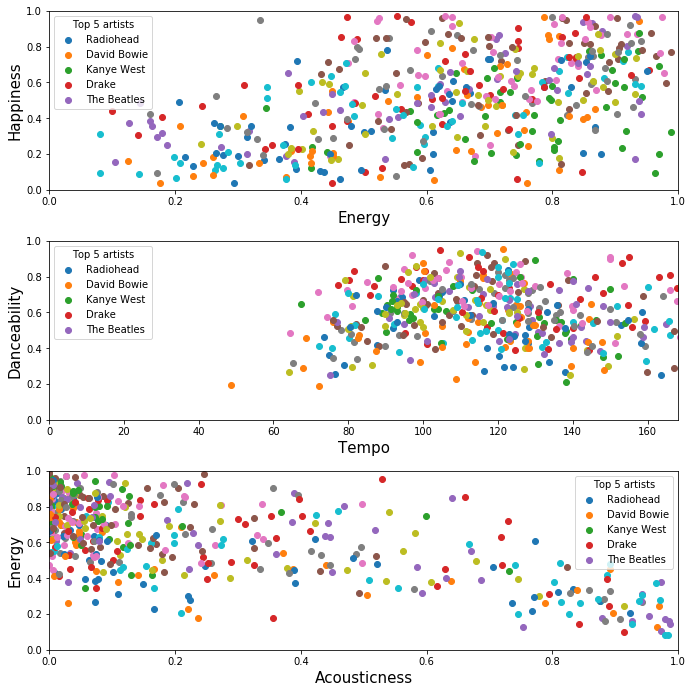

In [13]:
b = lastfm_country('USA',50)
compare(b)

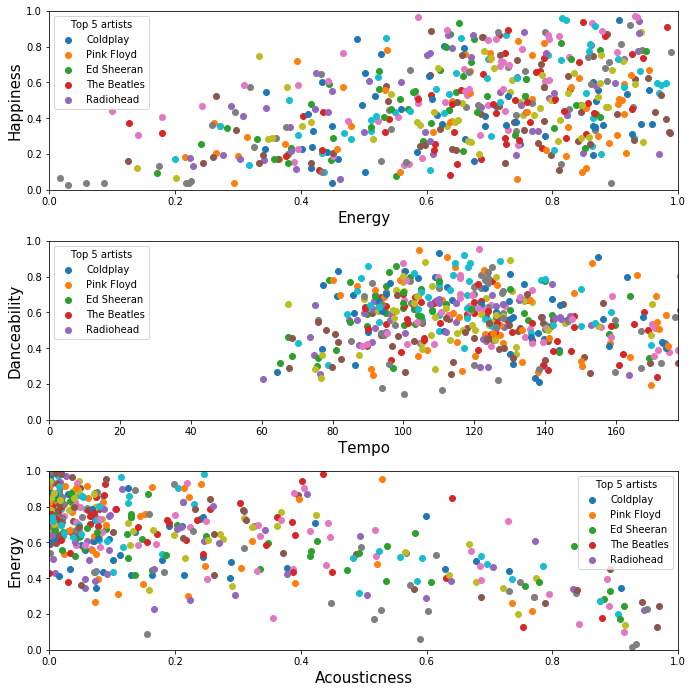

In [14]:
c = lastfm_country('India', 50)
compare(c)

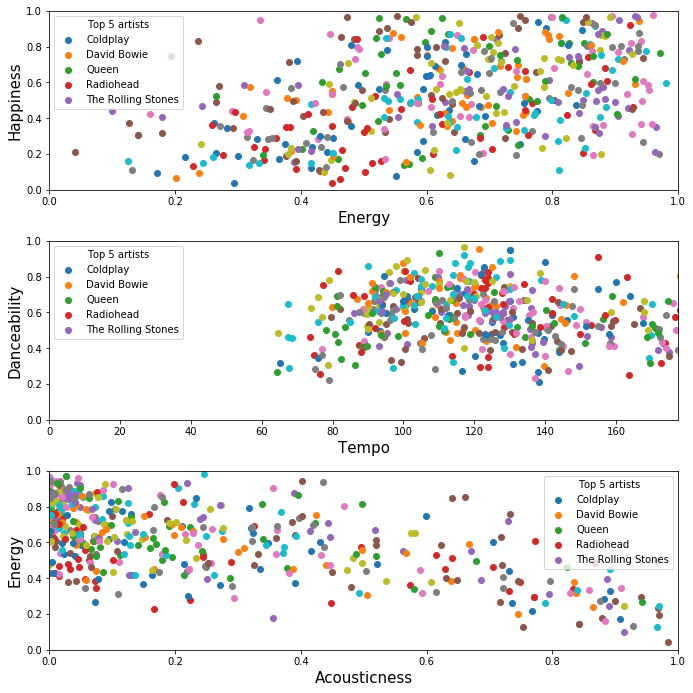

In [15]:
d = lastfm_country('Netherlands', 50)
compare(d)

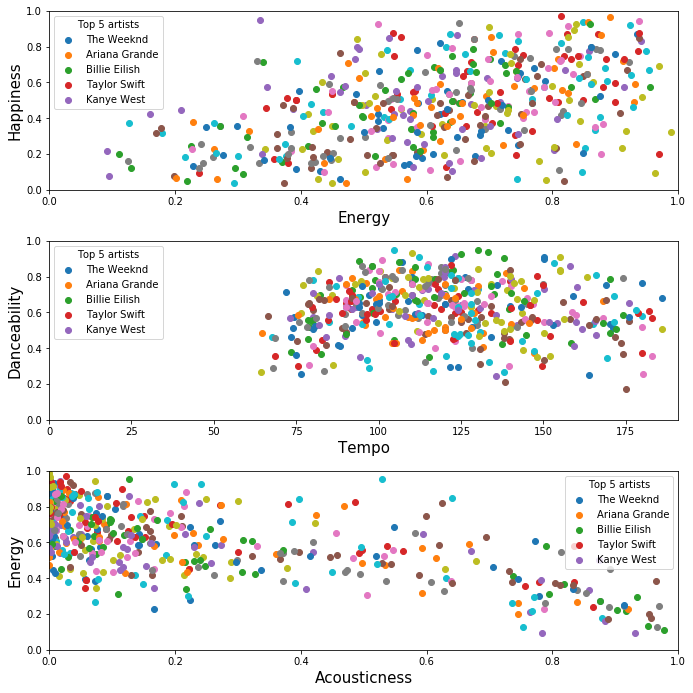

In [16]:
e = lastfm_global(50)
compare(e)

In [17]:
user_input = user_artists()

Enter the artists separated by commas - joy division, bauhaus


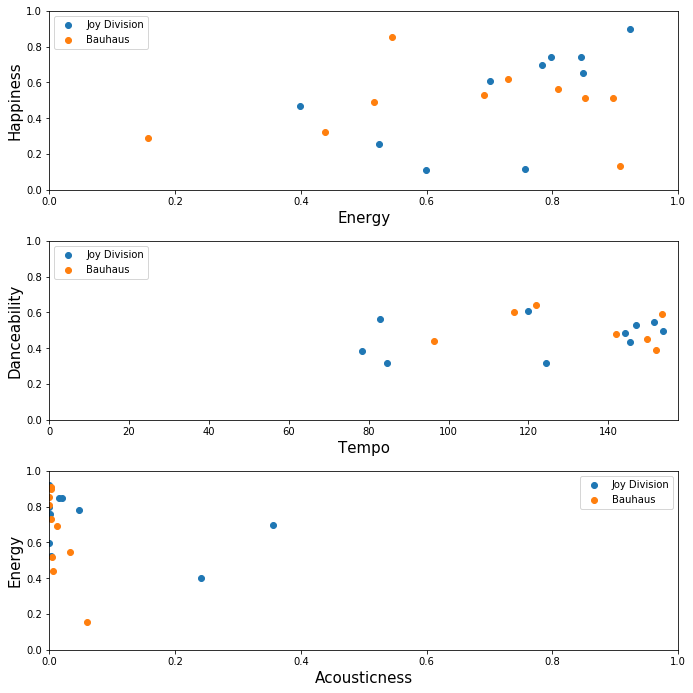

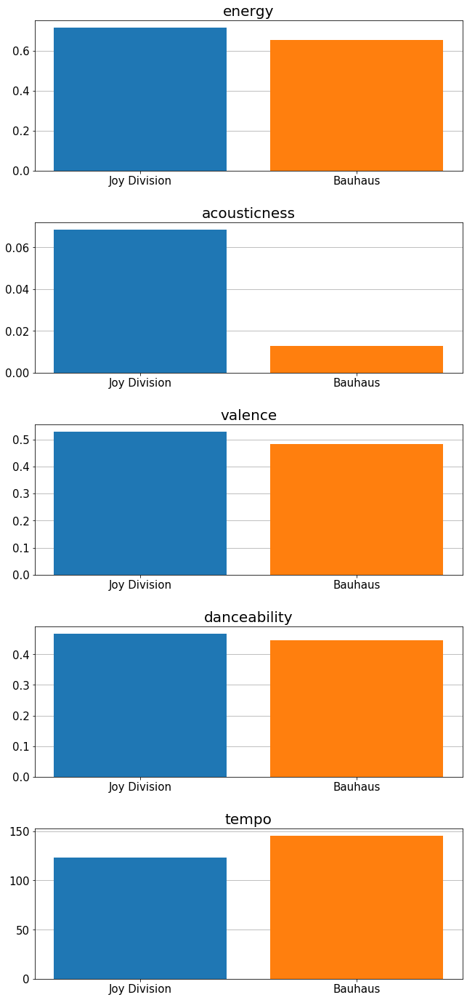

In [18]:
compare(user_input)

***
### Part IV: Gathering data from last.fm 
This part will focus on gathering song, artist and genre information from last.fm. Necessary functions are hence created and used. Some functions for accessing spotify song attributes (defined in the previous section) were also called here. This section is necessary before the third and fourth objectives of this assignment can be realized.

The data was cleaned and arranged into two separate files:
* _track_traits.csv_ - containing artist, track and song attribute information
* _traits_genres.csv_ - containing genres in addition to the information in track_traits.csv
Genres (or tags) could not be obtained for all tracks, and hence the second file has lesser datapoints as entries with missing genres were removed.  

<font color=red>**NOTE:**</font> Just skip ahead to [Read file 1](#file_1_read) and [Read file 2](#file_2_read) to read the two files defined above, and load them into dataframe _traits_df_ and _traits_with_genres_ respectively. It is recommended to just read from the files that were already created once, as the API calls take a very long time.
***

In [19]:
def my_top_tracks():
    fetch1 = {'method':'user.getTopTracks'}
    
    headers = {'user':lastfm['username']}
    url = 'http://ws.audioscrobbler.com/2.0/'
    
    fetch1['api_key'] = lastfm['API key']
    fetch1['format'] = 'json'
    fetch1['limit'] = 1000
    fetch1['user'] = lastfm['username']
    fetch1['period'] = 'overall'
    page = 1
    my_tracks = []
    
    while page < 6:
        fetch1['page'] = page
        tracks = requests.get(url, headers = headers, params = fetch1)
        mytracks_stored = tracks.json()
        pp.pprint(mytracks_stored)
        my_tracks.extend([(thing['artist']['name'], thing['name']) for thing in mytracks_stored['toptracks']['track']])
        pp.pprint(my_tracks)
        page = page+1
        time.sleep(0.25)
    
    print(my_tracks)
    f = open('artists_1.txt', 'w', encoding='utf-8')
    for t in my_tracks:
         f.write('%s,%s\n'%t)
    
#     return my_tracks    

In [20]:
#DO NOT run unless you need to update or create the file artists_1.txt
my_top_tracks()

{'toptracks': {'@attr': {'page': '1',
                         'perPage': '1000',
                         'total': '7008',
                         'totalPages': '8',
                         'user': 'DiffusedOctaves'},
               'track': [{'@attr': {'rank': '1'},
                          'artist': {'mbid': '69ee3720-a7cb-4402-b48d-a02c366f2bcf',
                                     'name': 'The Cure',
                                     'url': 'https://www.last.fm/music/The+Cure'},
                          'duration': '426',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a

                          'url': 'https://www.last.fm/music/Horsebeach/_/Faded+Eyes'},
                         {'@attr': {'rank': '12'},
                          'artist': {'mbid': '41a29629-d548-49a9-bc35-29c75f2dbd0e',
                                     'name': 'Horsebeach',
                                     'url': 'https://www.last.fm/music/Horsebeach'},
                          'duration': '219',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '041d8ad1-bc2e-47fa-abb4-5bf8e4f505e4',
                          'name': 'Dead Souls',
                          'playcount': '31',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Joy+Division/_/Dead+Souls'},
                         {'@attr': {'rank': '57'},
                          'artist': {'mbid': '9a58fda3-f4e

                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '1dd10fa8-bf31-3138-93b2-72e2c1e8bf41',
                          'name': 'Here She Comes',
                          'playcount': '26',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Slowdive/_/Here+She+Comes'},
                         {'@attr': {'rank': '87'},

                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '0f56dac4-5bb2-4d36-ba50-3b6d9264adbd',
                          'name': 'Haunting',
                          'playcount': '22',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Halsey/_/Haunting'},
                         {'@attr': {'rank': '130'},
                          'artist': {'mbid': '',
                                     'name': 'New Order',
                                     'url': 'https://www.last.fm/music/New+Order'},
    

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '011b291e-33f2-3a20-89ab-1839cb646716',
                          'name': 'Hey',
                          'playcount': '20',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                      

                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '05b35634-8d9d-3957-a3d9-65682cad7023',
                          'name': 'Seventeen Seconds',
                          'playcount': '18',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/The+Cure/_/Seventeen+Seconds'},
                         {'@attr': {'rank': '217'},
                          'artist': {'mbid': '4a51d885-9445-4e6a-a171-36e2d51dcfa0',
                                     'name': 'The Growlers',
                             

                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '04432155-8c7d-3beb-8e4b-64cf4844471e',
                          'name': 'We Never Change',
                          'playcount': '16',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Coldplay/_/We+Never+Change'},
                         {'@attr': {'rank': '245'},
                          'artist': {'mbid': '8538e728-ca0b-4321-b7e5-cff6565dd4c0',
                                     'name': 'Depeche Mode',
                                     'url': 'https://www.last.fm/music/Depeche+Mode'},
                          'duration': '296',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/3

                          'name': 'Nocturnes, Op. 9: No. 2 in E-Flat Major. '
                                  'Andante',
                          'playcount': '15',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Fr%C3%A9d%C3%A9ric+Chopin/_/Nocturnes,+Op.+9:+No.+2+in+E-Flat+Major.+Andante'},
                         {'@attr': {'rank': '282'},
                          'artist': {'mbid': '',
                                     'name': 'Frédéric Chopin',
                                     'url': 'https://www.last.fm/music/Fr%C3%A9d%C3%A9ric+Chopin'},
                          'duration': '0',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',

                                     'url': 'https://www.last.fm/music/Queen'},
                          'duration': '214',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '0238f91a-531d-32e8-8d7d-6dbae24665b6',
                          'name': 'Another One Bites the 

                          'name': 'Freestate',
                          'playcount': '13',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Depeche+Mode/_/Freestate'},
                         {'@attr': {'rank': '361'},
                          'artist': {'mbid': '8538e728-ca0b-4321-b7e5-cff6565dd4c0',
                                     'name': 'Depeche Mode',
                                     'url': 'https://www.last.fm/music/Depeche+Mode'},
                          'duration': '364',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'ht

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '02b1b7eb-7526-4190-95d1-e8d5b0f2461a',
                          'name': 'I Wanna Be Adored',
                          'playcount': '13',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
        

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '0072f300-c11f-4a83-8c6d-f5e0c656dbf7',
                          'name': 'Nancy Boy',
                          'playcount': '12',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '1a6cb441-f74f-48f3-a3b5-193be54cb679',
                          'name': 'Black Treacle',
                          'playcount': '11',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Arctic+Monkeys/_/Black+Treacle'},
                         {'@attr': {'rank': '471'},
                          'artist': {'mbid': 'f4f

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '01a0ee2d-d231-4114-ac7f-36abb962a6c0',
                          'name': 'Run of the Mill',
                          'playcount': '11',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Judas+Priest/_/Run+of+the+Mill'},
                         {'@attr': {'rank': '508'},
                          'artist': {'mbid': '54fc0558-12b5-4854-9d57-9441bcd73a72',
                                     'name': 'Kim Petras',
                                     'url': 'https://www.last.fm/music/Kim+Petras'},
                          'duration': '197',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
             

                          'name': 'Straight Shooter',
                          'playcount': '11',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/The+Mamas+&+the+Papas/_/Straight+Shooter'},
                         {'@attr': {'rank': '547'},
                          'artist': {'mbid': 'ba0d6274-db14-4ef5-b28d-657ebde1a396',
                                     'name': 'The Smashing Pumpkins',
                                     'url': 'https://www.last.fm/music/The+Smashing+Pumpkins'},
                          'duration': '327',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
        

                          'name': 'New Kid in Town',
                          'playcount': '10',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Eagles/_/New+Kid+in+Town'},
                         {'@attr': {'rank': '580'},
                          'artist': {'mbid': 'ccd4879c-5e88-4385-b131-bf65296bf245',
                                     'name': 'Echo & the Bunnymen',
                                     'url': 'https://www.last.fm/music/Echo+&+the+Bunnymen'},
                          'duration': '208',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                             

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '0046a510-b49b-3ac1-9b70-e30171018c1c',
                          'name': 'Renegade',
                          'playcount': '10',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Styx/_/Renegade'},
                         {'@attr': {'rank': '621'},
                          'artist': {'mbid': 'cbdbfa40-a839-4fa2-a5e1

                                     'url': 'https://www.last.fm/music/Camel'},
                          'duration': '355',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '098efe74-a794-44cd-8bd6-e9f2bbced519',
                          'name': 'Freefall',
           

                                     'size': 'extralarge'}],
                          'mbid': '0821d583-170e-30be-9ce4-0f07d998c5f1',
                          'name': 'Where Is My Mind?',
                          'playcount': '9',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Pixies/_/Where+Is+My+Mind%3F'},
                         {'@attr': {'rank': '705'},
                          'artist': {'mbid': '',
                                     'name': 'Placebo',
                                     'url': 'https://www.last.fm/music/Placebo'},
                          'duration': '185',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
     

                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '070ab35b-63b5-3d07-b965-1fb7e2821387',
                          'name': 'Eddie My Love',
                          'playcount': '9',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/The+Chordettes/_/Eddie+My+Love'},
                         {'@attr': {'rank': '745'},
                          'artist': {'mbid': '69ee3720-a7cb-4402-b48d-a02c366f2bcf',
                                     'name': 'The Cure',
                                     'url': 'https://www.last.fm/music/The+Cure'},
                          'duration': '261',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '2d183933-5431-4005-a1b2-da877356cea7',
                          'name': 'Heaven Only Knows',
                          'playcount': '8',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
         

                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': "She's Lost Control - Single Version",
                          'playcount': '8',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Joy+Division/_/She%27s+Lost+Control+-+Single+Version'},
                         {'@attr': {'rank': '810'},
                          'artist': {'mbid': '6b335658-22c8-485d-93de-0bc29a1d0349',
                                     'name': 'Judas Priest',
                                     'url': 'https://www.last.fm/music/Judas+Priest'},
                          'duration': '409',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/

                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '01dfe5b1-4c8f-4bd7-8f89-c1747d3a169a',
                          'name': 'The Daily Mail',
                          'playcount': '8',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Radiohead/_/The+Daily+Mail'},
                         {'@attr': {'rank': '848'},
                          'artist': {'mbid': '3798b104-01cb-484c-a3b0-56adc6399b80',
                                     'name': 'Rage Against the Machine',
                                     'url': 'https://www.last.fm/music/Rage+Against+the+Machine'},
                          'duration': '295',
                          'image': [{'#text': 'https://lastfm.fr

                          'mbid': '68464377-d62f-47ed-9397-58b4b3864084',
                          'name': 'closer',
                          'playcount': '8',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/The+Underground+Youth/_/closer'},
                         {'@attr': {'rank': '886'},
                          'artist': {'mbid': '66663ccb-5cba-4ecf-8041-723789e9c06a',
                                     'name': 'The Underground Youth',
                                     'url': 'https://www.last.fm/music/The+Underground+Youth'},
                          'duration': '177',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
           

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '0235ebd3-2b8b-3f36-931f-a2b551403fa0',
                          'name': 'You Never Can Tell',
                          'playcount': '7',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Chuck+Berry/_/You+Never+Can+Tell'},
                         {'@attr': {'rank': '929'},
                          'artist': {'mbid'

                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Molchat+Doma/_/%D1%82%D0%B5%D1%85%D0%BD%D0%BE%D0%BB%D0%BE%D0%B3%D0%B8%D1%8F'},
                         {'@attr': {'rank': '975'},
                          'artist': {'mbid': '8ca01f46-53ac-4af2-8516-55a909c0905e',
                                     'name': 'My Bloody Valentine',
                                     'url': 'https://www.last.fm/music/My+Bloody+Valentine'},
                          'duration': '319',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly

 ('Radiohead', 'Creep'),
 ('Simon & Garfunkel', 'Baby Driver'),
 ('Slowdive', 'Avalyn II'),
 ('Sunnyboys', 'Let You Go'),
 ('Talking Heads', "Memories Can't Wait"),
 ('Talking Heads', 'Psycho Killer - 2005 Remaster'),
 ('Talking Heads', 'The Overload'),
 ('Tame Impala', 'Keep On Lying'),
 ('The Cure', 'A Short Term Effect'),
 ('The Cure', 'Primary'),
 ('The Cure', 'Secrets'),
 ('The Eagles', 'Witchy Woman'),
 ('The Growlers', 'Monotonia'),
 ('The Jesus and Mary Chain', 'Nine Million Rainy Days'),
 ('The Kinks', 'Sunny Afternoon'),
 ('The Neighbourhood', 'Daddy Issues'),
 ('The Neighbourhood', 'Sweater Weather'),
 ('The Stone Roses', 'I Wanna Be Adored'),
 ('The Velvet Underground', 'Candy Says'),
 ('The Velvet Underground', 'Cool It Down'),
 ('The Verve', 'Appalachian Springs'),
 ('Weyes Blood', 'Everyday'),
 ('Weyes Blood', 'Something to Believe'),
 ('Whitesnake', 'Here I Go Again'),
 ('Andy Gibb', 'Shadow Dancing'),
 ('Arctic Monkeys', 'Mardy Bum'),
 ('Billy Bragg', 'California Stars

{'toptracks': {'@attr': {'page': '2',
                         'perPage': '1000',
                         'total': '7008',
                         'totalPages': '8',
                         'user': 'DiffusedOctaves'},
               'track': [{'@attr': {'rank': '1001'},
                          'artist': {'mbid': '5cbef01b-cc35-4f52-af7b-d0df0c4f61b9',
                                     'name': 'Sonic Youth',
                                     'url': 'https://www.last.fm/music/Sonic+Youth'},
                          'duration': '426',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/

                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '05730d13-f7bc-4d8e-a1ce-187d8f905054',
                          'name': 'Some Kind of Stranger',
                          'playcount': '7',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/The+Sisters+of+Mercy/_/Some+Kind+of+Stranger'},
                         

                                     'size': 'extralarge'}],
                          'mbid': '0ceac21f-da8d-4a56-9e37-3e33b92f6205',
                          'name': 'Shayla',
                          'playcount': '6',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Blondie/_/Shayla'},
                         {'@attr': {'rank': '1071'},
                          'artist': {'mbid': '4d2956d1-a3f7-44bb-9a41-67563e1a0c94',
                                     'name': 'Blondie',
                                     'url': 'https://www.last.fm/music/Blondie'},
                          'duration': '281',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b82156

                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Guns+N%27+Roses/_/Knockin%27+on+Heaven%27s+Door'},
                         {'@attr': {'rank': '1114'},
                          'artist': {'mbid': 'eeb1195b-f213-4ce1-b28c-8565211f8e43',
                                     'name': "Guns N' Roses",
                                     'url': 'https://www.last.fm/music/Guns+N%27+Roses'},
                          'duration': '355',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b8

                                     'name': 'King Crimson',
                                     'url': 'https://www.last.fm/music/King+Crimson'},
                          'duration': '532',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '0397fea4-831c-4024-ae61-6a02

                          'duration': '223',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '001a3a3b-f6c4-4b7a-a922-d1b814a83ce6',
                          'name': 'Lift',
                          'playcount': '6',
                          'streamable': {'#text': '

                          'mbid': '',
                          'name': 'First Week / Last Week....Carefree - 2005 '
                                  'Remaster',
                          'playcount': '6',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Talking+Heads/_/First+Week+%2F+Last+Week....Carefree+-+2005+Remaster'},
                         {'@attr': {'rank': '1233'},
                          'artist': {'mbid': 'a94a7155-c79d-4409-9fcf-220cb0e4dc3a',
                                     'name': 'Talking Heads',
                                     'url': 'https://www.last.fm/music/Talking+Heads'},
                          'duration': '265',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.f

                                     'url': 'https://www.last.fm/music/Yeah+Yeah+Yeahs'},
                          'duration': '0',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': 'heads will roll (original)',
                     

                          'playcount': '5',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Creedence+Clearwater+Revival/_/Cotton+Fields'},
                         {'@attr': {'rank': '1316'},
                          'artist': {'mbid': '109958eb-a335-4c5e-907e-597ff4c6af46',
                                     'name': 'Creedence Clearwater Revival',
                                     'url': 'https://www.last.fm/music/Creedence+Clearwater+Revival'},
                          'duration': '145',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text'

                          'url': 'https://www.last.fm/music/Funkadelic/_/Maggot+Brain'},
                         {'@attr': {'rank': '1359'},
                          'artist': {'mbid': '71b8c13a-7a89-4f76-a19d-18819a4fa6e5',
                                     'name': 'Ghostly Kisses',
                                     'url': 'https://www.last.fm/music/Ghostly+Kisses'},
                          'duration': '203',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                         

                          'name': 'Try Me',
                          'playcount': '5',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Kero+Kero+Bonito/_/Try+Me'},
                         {'@attr': {'rank': '1395'},
                          'artist': {'mbid': '5e284bdc-3774-41dc-b5e2-b125d0349acf',
                                     'name': 'Kero Kero Bonito',
                                     'url': 'https://www.last.fm/music/Kero+Kero+Bonito'},
                          'duration': '177',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text

                          'mbid': '075c857c-7811-4fad-bfdf-2afce7e2223d',
                          'name': 'Packt Like Sardines in a Crushd Tin Box',
                          'playcount': '5',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Radiohead/_/Packt+Like+Sardines+in+a+Crushd+Tin+Box'},
                         {'@attr': {'rank': '1438'},
                          'artist': {'mbid': '3798b104-01cb-484c-a3b0-56adc6399b80',
                                     'name': 'Rage Against the Machine',
                                     'url': 'https://www.last.fm/music/Rage+Against+the+Machine'},
                          'duration': '313',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.n

                                     'name': 'Talking Heads',
                                     'url': 'https://www.last.fm/music/Talking+Heads'},
                          'duration': '313',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '017a65f3-16b1-338f-92d3-4b

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '02f5984e-a73b-32dc-a9e1-10ff30c51326',
                          'name': 'Sense of Purpose',
                          'playcount': '5',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/The+Sound/_/Sense+of+Purpose'},
                         {'@attr': {'rank': '1515'},
                          'artist': {'mbid': '07eb40a2-2914-439c-a01d-15a685b84ddf',
                                     'name': 'The Specials',
                                     'url': 'https://www.last.fm/music/The+Specials'},

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '1212dba1-71a1-43be-8796-f19316aee5d4',
                          'name': 'Too Late',
                          'playcount': '5',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                  

                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Bob+Seger/_/Turn+the+Page'},
                         {'@attr': {'rank': '1595'},
                          'artist': {'mbid': '5403bf6e-bc1d-4e62-b31f-926a2bf66a14',
                                     'name': 'Boney M.',
                                     'url': 'https://www.last.fm/music/Boney+M.'},
                          'duration': '243',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                  

                          'playcount': '4',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Easy+Life/_/Earth'},
                         {'@attr': {'rank': '1635'},
                          'artist': {'mbid': 'ccd4879c-5e88-4385-b131-bf65296bf245',
                                     'name': 'Echo & the Bunnymen',
                                     'url': 'https://www.last.fm/music/Echo+&+the+Bunnymen'},
                          'duration': '155',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s

                                     'size': 'extralarge'}],
                          'mbid': '05aa4fff-14f2-3a20-be6e-67c706dd3d21',
                          'name': 'Quiet Life',
                          'playcount': '4',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Japan/_/Quiet+Life'},
                         {'@attr': {'rank': '1669'},
                          'artist': {'mbid': '39c2a93d-9afa-4a22-9bba-c087ab056e1c',
                                     'name': 'Jefferson Airplane',
                                     'url': 'https://www.last.fm/music/Jefferson+Airplane'},
                          'duration': '385',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a

                          'artist': {'mbid': '64cdc08f-ba6f-41fe-94be-452dc6d5108e',
                                     'name': 'Marcy Playground',
                                     'url': 'https://www.last.fm/music/Marcy+Playground'},
                          'duration': '171',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                               

                          'artist': {'mbid': '',
                                     'name': 'Oasis',
                                     'url': 'https://www.last.fm/music/Oasis'},
                          'duration': '377',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'm

                          'name': 'Animate',
                          'playcount': '4',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Rush/_/Animate'},
                         {'@attr': {'rank': '1781'},
                          'artist': {'mbid': 'f1d7f1fd-8883-47e9-ad2b-e9ec9ff61aac',
                                     'name': 'Sam & Dave',
                                     'url': 'https://www.last.fm/music/Sam+&+Dave'},
                          'duration': '195',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.fre

                          'artist': {'mbid': 'a74f43e4-50c4-4b19-a2ce-c05ce9bccb03',
                                     'name': 'Talk Talk',
                                     'url': 'https://www.last.fm/music/Talk+Talk'},
                          'duration': '198',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 

                          'artist': {'mbid': '9efff43b-3b29-4082-824e-bc82f646f93d',
                                     'name': 'The Doors',
                                     'url': 'https://www.last.fm/music/The+Doors'},
                          'duration': '260',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 

                          'duration': '0',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': 'The Headmaster Ritual - 2011 Remaster',
                          'playcount': '4',
                          'streamable': {'#text': '0', '

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '075b9fb9-9218-31d1-bb78-cd15d7b6c4d1',
                          'name': 'The Commercial',
                          'playcount': '4',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
            

                          'name': 'Do I Wanna Know?',
                          'playcount': '3',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Arctic+Monkeys/_/Do+I+Wanna+Know%3F'},
                         {'@attr': {'rank': '1971'},
                          'artist': {'mbid': 'ada7a83c-e3e1-40f1-93f9-3e73dbc9298a',
                                     'name': 'Arctic Monkeys',
                                     'url': 'https://www.last.fm/music/Arctic+Monkeys'},
                          'duration': '163',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                           

 ('The Underground Youth', 'Hope & Pray'),
 ('The Velvet Underground', 'Head Held High'),
 ('The Velvet Underground', 'New Age'),
 ('The Velvet Underground', 'Pale Blue Eyes'),
 ('The Velvet Underground', 'Train Round The Bend'),
 ('The Velvet Underground', 'What Goes On'),
 ('The Velvet Underground', 'White Light/White Heat (Live)'),
 ('The Yardbirds', 'Boom Boom'),
 ('The Zombies', 'The Look of Love'),
 ('Throbbing Gristle', 'I.B.M.'),
 ('UFO', 'Doctor Doctor'),
 ('Weyes Blood', 'Mirror Forever'),
 ('Wire', 'Marooned'),
 ('ABBA', 'Chiquitita'),
 ('AC/DC', 'Hells Bells'),
 ('Ace of Base', 'All That She Wants'),
 ('Alice in Chains', 'Rotten Apple'),
 ('Barrie', 'Clovers'),
 ('Billy Joel', 'The Stranger'),
 ('Black Sabbath', 'Planet Caravan'),
 ('Cage the Elephant', 'Trouble'),
 ('Coldplay', 'Animals'),
 ('Coldplay', 'Square One'),
 ('Coldplay', 'Talk'),
 ('Creedence Clearwater Revival', 'Fortunate Son'),
 ('Darcie', 'Mango'),
 ('Daryl Hall & John Oates', 'Maneater'),
 ('Doja Cat', 'Str

{'toptracks': {'@attr': {'page': '3',
                         'perPage': '1000',
                         'total': '7008',
                         'totalPages': '8',
                         'user': 'DiffusedOctaves'},
               'track': [{'@attr': {'rank': '2001'},
                          'artist': {'mbid': '64b94289-9474-4d43-8c93-918ccc1920d1',
                                     'name': 'Billy Joel',
                                     'url': 'https://www.last.fm/music/Billy+Joel'},
                          'duration': '199',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': 'Terryfold (ft. Justin Roiland)',
                          'playcount': '3',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url':

                          'artist': {'mbid': '8538e728-ca0b-4321-b7e5-cff6565dd4c0',
                                     'name': 'Depeche Mode',
                                     'url': 'https://www.last.fm/music/Depeche+Mode'},
                          'duration': '171',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     's

                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Franz+Ferdinand/_/Darts+of+Pleasure'},
                         {'@attr': {'rank': '2127'},
                          'artist': {'mbid': 'aa7a2827-f74b-473c-bd79-03d065835cf7',
                                     'name': 'Franz Ferdinand',
                                     'url': 'https://www.last.fm/music/Franz+Ferdinand'},
                          'duration': '201',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.

                                     'url': 'https://www.last.fm/music/Jefferson+Airplane'},
                          'duration': '177',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '00050832-7a29-4146-ab1d-d184fa6fb4ea',
                          'name': 'Today',
 

                          'mbid': '002c1152-53d1-3b82-a117-44fe0893d677',
                          'name': 'Rock and Roll',
                          'playcount': '3',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Led+Zeppelin/_/Rock+and+Roll'},
                         {'@attr': {'rank': '2202'},
                          'artist': {'mbid': '678d88b2-87b0-403b-b63d-5da7465aecc3',
                                     'name': 'Led Zeppelin',
                                     'url': 'https://www.last.fm/music/Led+Zeppelin'},
                          'duration': '230',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                       

                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '00a8a00d-f3f5-32b9-9f7f-ce6f9673d253',
                          'name': 'Falling Away With You',
                          'playcount': '3',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Muse/_/Falling+Away+With+You'},
                         {'@attr': {'rank

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': 'Apologize',
                          'playcount': '3',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm

                          'playcount': '3',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Saint+Etienne/_/Girl+VII'},
                         {'@attr': {'rank': '2333'},
                          'artist': {'mbid': '3997d4a6-c2bd-4191-8406-eb07f0abb5d2',
                                     'name': 'Saint Etienne',
                                     'url': 'https://www.last.fm/music/Saint+Etienne'},
                          'duration': '224',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96

                         {'@attr': {'rank': '2365'},
                          'artist': {'mbid': '5cbef01b-cc35-4f52-af7b-d0df0c4f61b9',
                                     'name': 'Sonic Youth',
                                     'url': 'https://www.last.fm/music/Sonic+Youth'},
                          'duration': '263',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b82

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '4a2026bb-4445-41a3-b99e-46ecb1d21b21',
                          'name': 'Set The Fire',
                          'playcount': '3',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
              

                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': 'Eleanor Rigby - Remastered 2009',
                          'playcount': '3',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/The+Beatles/_/Eleanor+Rigby+-+Remastered+2009'},
                         {'@attr': {'rank': '2441'

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '0a466dad-4acb-49ff-aded-7b36f73504d2',
                          'name': 'Sowing Seeds',
                          'playcount': '3',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
              

                          'mbid': '',
                          'name': "She's So Epic",
                          'playcount': '3',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/The+Vera+Violets/_/She%27s+So+Epic'},
                         {'@attr': {'rank': '2525'},
                          'artist': {'mbid': 'd4d17620-fd97-4574-92a8-a2cb7e72ce42',
                                     'name': 'The Verve',
                                     'url': 'https://www.last.fm/music/The+Verve'},
                          'duration': '358',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
   

                          'url': 'https://www.last.fm/music/%E7%AB%B9%E5%86%85%E3%81%BE%E3%82%8A%E3%82%84/_/Broken+Heart'},
                         {'@attr': {'rank': '2566'},
                          'artist': {'mbid': '02bdc7ec-d102-4698-85e2-789a42d40b9c',
                                     'name': '竹内まりや',
                                     'url': 'https://www.last.fm/music/%E7%AB%B9%E5%86%85%E3%81%BE%E3%82%8A%E3%82%84'},
                          'duration': '237',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                       

                          'name': 'Time Travel',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Antologie/_/Time+Travel'},
                         {'@attr': {'rank': '2602'},
                          'artist': {'mbid': 'ad79836d-9849-44df-8789-180bbc823f3c',
                                     'name': 'Antonio Vivaldi',
                                     'url': 'https://www.last.fm/music/Antonio+Vivaldi'},
                          'duration': '601',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#tex

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '144f135f-7166-4655-994e-103eb89af98b',
                          'name': 'Way Over Yonder In The Minor Key',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Billy+Bragg/_/Way+Over+Yonder+In+The+Minor+Key'},
                         {'@attr': {'rank': '2651'},
                          'artist': {'mbid': '64b94289-9474-4d43-8c93-918ccc1920d1',
                                     'name': 'Billy Joel',
                                     'url': 'https://www.last.fm/music/Billy+Joel'},
                          'duration': '455',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41

                          'mbid': '',
                          'name': 'Good Boys - Blow-Up Mix / Remastered',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Blondie/_/Good+Boys+-+Blow-Up+Mix+%2F+Remastered'},
                         {'@attr': {'rank': '2684'},
                          'artist': {'mbid': '4d2956d1-a3f7-44bb-9a41-67563e1a0c94',
                                     'name': 'Blondie',
                                     'url': 'https://www.last.fm/music/Blondie'},
                          'duration': '178',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                          

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': 'e8ae7791-1135-3786-884d-b975fb56386a',
                          'name': 'Blue Jade',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                 

                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Charli+XCX/_/Drugs+(feat.+ABRA)'},
                         {'@attr': {'rank': '2761'},
                          'artist': {'mbid': '260b6184-8828-48eb-945c-bc4cb6fc34ca',
                                     'name': 'Charli XCX',
                                     'url': 'https://www.last.fm/music/Charli+XCX'},
                          'duration': '234',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a9

                          'mbid': '039a81f4-c4b7-3104-b927-67f103013071',
                          'name': 'Change (In the House of Flies)',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Deftones/_/Change+(In+the+House+of+Flies)'},
                         {'@attr': {'rank': '2799'},
                          'artist': {'mbid': '7527f6c2-d762-4b88-b5e2-9244f1e34c46',
                                     'name': 'Deftones',
                                     'url': 'https://www.last.fm/music/Deftones'},
                          'duration': '367',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
 

                                     'name': 'Doja Cat',
                                     'url': 'https://www.last.fm/music/Doja+Cat'},
                          'duration': '166',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '12ea2397-5508-4e8c-bb90-1a6a5f914876

                                     'url': 'https://www.last.fm/music/Elton+John'},
                          'duration': '247',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '01c45fc7-cdd3-4e90-a310-d2a9021e86c4',
                          'name': 'Rock And Roll Mad

                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': 'Oh What a Beautiful Morning',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Gordon+McCrae/_/Oh+What+a+Beautiful+Morning'},
                         {'@attr': {'rank': '2911'},
                          'artist': {'mbid': 'e21857d5-3256-4547-afb3-4b6ded592596',
                                     'name': 'Gorillaz',
                                     'url': 

                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Indochine/_/Punishment+Park'},
                         {'@attr': {'rank': '2955'},
                          'artist': {'mbid': '',
                                     'name': 'Interpol',
                                     'url': 'https://www.last.fm/music/Interpol'},
                          'duration': '215',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'

                          'mbid': '06b9d420-e4b0-3916-92f1-fb27793571ba',
                          'name': 'Komakino',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Joy+Division/_/Komakino'},
                         {'@attr': {'rank': '3000'},
                          'artist': {'mbid': '',
                                     'name': 'Joy Division',
                                     'url': 'https://www.last.fm/music/Joy+Division'},
                          'duration': '0',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
               

 ('Franz Ferdinand', 'Michael'),
 ('Franz Schubert', 'Serenade'),
 ('Franz Schubert', 'Serenade, D. 957 No. 4'),
 ('Froth', 'Lost My Mind'),
 ('Fugazi', "I'm So Tired"),
 ('fun.', 'Some Nights'),
 ('Ghostly Kisses', 'Spellbound (Acoustic)'),
 ('Ghostly Kisses', 'Touch (Piano Version)'),
 ('Go Ichinose', 'Littleroot Town'),
 ('Godspeed You! Black Emperor', 'East Hastings'),
 ('Golden Daze', 'Wayward Tide'),
 ('Gorillaz', 'All Alone'),
 ('Gorillaz', 'Every Planet We Reach Is Dead'),
 ('Gorillaz', 'On Melancholy Hill'),
 ('Green Day', 'Boulevard of Broken Dreams'),
 ('Groove Armada', 'Think Twice'),
 ("Guns N' Roses", 'Estranged'),
 ('Guster', 'Dear Valentine'),
 ('HAIM', 'Falling'),
 ('Halsey', 'Control'),
 ('Halsey', 'Drive'),
 ('Hank Williams', 'Lost Highway'),
 ('Holy Wave', 'Western Playland'),
 ('Hooverphonic', 'Mad About You (Orchestra)'),
 ('Horsebeach', 'Acting'),
 ('Horsebeach', 'Beauty & Sadness'),
 ('Horsebeach', 'emilia'),
 ('Horsebeach', 'theme for sadness'),
 ('Inhaler', 'W

{'toptracks': {'@attr': {'page': '4',
                         'perPage': '1000',
                         'total': '7008',
                         'totalPages': '8',
                         'user': 'DiffusedOctaves'},
               'track': [{'@attr': {'rank': '3001'},
                          'artist': {'mbid': '',
                                     'name': 'Joy Division',
                                     'url': 'https://www.last.fm/music/Joy+Division'},
                          'duration': '0',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b8215

                          'name': 'Here Come the Tears',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Judas+Priest/_/Here+Come+the+Tears'},
                         {'@attr': {'rank': '3011'},
                          'artist': {'mbid': '6b335658-22c8-485d-93de-0bc29a1d0349',
                                     'name': 'Judas Priest',
                                     'url': 'https://www.last.fm/music/Judas+Priest'},
                          'duration': '307',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                             

                          'mbid': '585577ad-e995-4a49-a75d-dc044d9364f7',
                          'name': 'De Manier',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Kraantje+Pappie/_/De+Manier'},
                         {'@attr': {'rank': '3048'},
                          'artist': {'mbid': '',
                                     'name': 'Kris Kross Amsterdam',
                                     'url': 'https://www.last.fm/music/Kris+Kross+Amsterdam'},
                          'duration': '195',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'me

                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '03536745-1cfd-429b-bc72-2f89806ef471',
                          'name': 'Make Up',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Lou+Reed/_/Make+Up'},
                         {'@attr': {'rank': '3087'},
                          'artist': {'mbid': '9d1ebcfe-4c15-4d18-95d3-d919898638a1',
                                     'name': 'Lou Reed',
                                     'url': 'https://www.last.fm/music/Lou+Reed'},
                          'duration': '175',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '53212c94-7a98-4ab2-a0d8-aa1b40be0c8b',
                          'name': 'Plain View',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Men+I+Trust/_/Plain+View'},
                         {'@attr': {'rank': '3129'},
                          'artist': {'mbid': '25ab7547-a4d2-480b-b028-c7f3497bc858',
                                     'name': 'Men I Trust',
                                     'url': 'https://www.last.fm/music/Men+I+Trust'},
                          'duration': '189',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                      

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '09bb3b8f-2214-4280-830c-b8abda2608dc',
                          'name': 'Walk On',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Neil+Young/_/Walk+On'},
                         {'@attr': {'rank': '3168'},
                          'artist': {'mbid': '75167b8b-44e4-407b-9d35-effe87b223cf',
                                     'name': 'Neil Young',
                                     'url': 'https://www.last.fm/music/Neil+Young'},
                          'duration': '990',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                               

                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': "Rock 'N' Roll Star - Remastered",
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Oasis/_/Rock+%27N%27+Roll+Star+-+Remastered'},
                         {'@attr': {'rank': '3212'},
                          'artist': {'mbid': '',
                                     'name': 'Oasis',
                                     'url': 'https://www.last.fm/music/Oasis'},
                          'duration': '283',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
           

                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Placebo/_/Spite+and+Malice'},
                         {'@attr': {'rank': '3248'},
                          'artist': {'mbid': '',
                                     'name': 'Placebo',
                                     'url': 'https://www.last.fm/music/Placebo'},
                          'duration': '179',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},


                          'duration': '237',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '064db8bf-84ad-3441-bd1a-9ff6d6fc343e',
                          'name': 'Like Spinning Plates',
                          'playcount': '2',
                          'streamab

                                     'url': 'https://www.last.fm/music/Ruby+Haunt'},
                          'duration': '151',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '3b19e9db-7663-48d1-b347-4ae685095b90',
                          'name': 'Drowning',
      

                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '2dd046a5-54a0-41ca-8713-8c1b38fe6453',
                          'name': 'Sleep',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Slowdive/_/Sleep'},
                         {'@attr': {'rank': '3364'},
                          'artist': {'mbid': 'a16371b9-7d36-497a-a9d4-42b0a0440c5e',
                                     'name': 'Slowdive',
                                     'url': 'https://www.

                                     'url': 'https://www.last.fm/music/Styx'},
                          'duration': '193',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '023eede0-79cc-342e-b9ee-38f861db9172',
                          'name': 'Best Thing',
          

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': 'Dum Dum Girl (12" mix)',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Talk+Talk/_/Dum+Dum+Girl+(12%22+mix)'},
                         {'@attr': {'rank': '3442'},
                          'artist': {'mbid': '',
                                     'name': 'Talk Talk',
                                     'url': 'https://www.last.fm/music/Talk+Talk'},
                          'duration': '0',
                    

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': "I'm Only Sleeping - Remastered 2009",
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          '

                         {'@attr': {'rank': '3531'},
                          'artist': {'mbid': '69ee3720-a7cb-4402-b48d-a02c366f2bcf',
                                     'name': 'The Cure',
                                     'url': 'https://www.last.fm/music/The+Cure'},
                          'duration': '622',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.

                                     'url': 'https://www.last.fm/music/The+Jesus+and+Mary+Chain'},
                          'duration': '209',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '05e67248-e721-4362-855b-ad936c0acfa4',
                          'name': 'Hit

                                     'name': 'The Smiths',
                                     'url': 'https://www.last.fm/music/The+Smiths'},
                          'duration': '0',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name

                         {'@attr': {'rank': '3645'},
                          'artist': {'mbid': '66663ccb-5cba-4ecf-8041-723789e9c06a',
                                     'name': 'The Underground Youth',
                                     'url': 'https://www.last.fm/music/The+Underground+Youth'},
                          'duration': '272',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': 'Girls Like (feat. Zara Larsson)',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Tinie+Tempah/_/Girls+Like+(feat.+Zara+Larsson)'},
                         {'@attr': {'rank': '3687'},
                          'artist': {'mbid': '462a8

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '028d3e4e-ac22-35b7-9ea3-73b5f194904e',
                          'name': 'El Scorcho',
                          'playcount': '2',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                

                                     'url': 'https://www.last.fm/music/Zero+7'},
                          'duration': '337',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '053e701c-59c8-4e7b-a31e-2d71afa96bd3',
                          'name': 'Destiny',
           

                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '18d06888-97dc-329d-b4e4-84e7a4d78467',
                          'name': 'Do the Du',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/A+Certain+Ratio/_/Do+the+Du'},
                         {'@attr': {'rank': '3798'},
 

                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': 'ce6e1ec8-e8f0-45b4-a470-60c3f405e81c',
                          'name': 'Bhool',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Albatross/_/Bhool'},
                         {'@attr': {'rank': '3847'},
               

                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Am%C3%A9rico+Brito/_/Sintado+Na+Pracinha'},
                         {'@attr': {'rank': '3884'},
                          'artist': {'mbid': '',
                                     'name': 'Amit Trivedi & Tochi Raina',
                                     'url': 'https://www.last.fm/music/Amit+Trivedi+&+Tochi+Raina'},
                          'duration': '0',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
     

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '00fe151c-dff0-37c9-9c02-0fc4e032ed7f',
                          'name': 'Dancing Shoes',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Arctic+Monkeys/_/Dancing+Shoes'},
                         {'@attr': {'rank': '3927'},
                          'artist': {'mbid': 'ada7a83c-e3e1-40f1-93f9-3e73dbc9298a',
                                     'name': 'Arctic Monkeys',
                                     'url': 'https://www.last.fm/music/Arctic+Monkeys'},
                          'duration': '177',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
       

                          'artist': {'mbid': 'f4fdbb4c-e4b7-47a0-b83b-d91bbfcfa387',
                                     'name': 'Ariana Grande & Justin Bieber',
                                     'url': 'https://www.last.fm/music/Ariana+Grande+&+Justin+Bieber'},
                          'duration': '228',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
     

 ('Depeche Mode', 'Policy of Truth'),
 ('Echo & the Bunnymen', 'With a Hip'),
 ('Men I Trust', 'Seven'),
 ('Talk Talk', 'Candy'),
 ('The Mamas & the Papas', "California Dreamin'"),
 ('Horsebeach', 'Dreaming'),
 ('Styx', 'Man In The Wilderness'),
 ('The Cure', 'Lovesong'),
 ('Joy Division', 'Decades - 2007 Remaster'),
 ('Joy Division', 'Shadowplay'),
 ('Talk Talk', "I Don't Believe in You"),
 ('Joy Division', 'Isolation'),
 ('Slowdive', 'When the Sun Hits'),
 ('The Cure', 'A Forest'),
 ('The Growlers', 'Love Test'),
 ('The Growlers', 'Not the Man'),
 ('Franz Ferdinand', 'Take Me Out'),
 ('Horsebeach', 'Clouds'),
 ('Joy Division', 'Wilderness - 2007 Remaster'),
 ('Slowdive', 'Altogether'),
 ('Talking Heads', 'Crosseyed and Painless'),
 ('The Cure', 'Other Voices'),
 ('The Weeknd', 'Starboy'),
 ('Charli XCX', 'Roll with Me'),
 ('Horsebeach', 'Even'),
 ('Placebo', 'Lady of the Flowers'),
 ('Slowdive', "Celia's Dream"),
 ('Depeche Mode', 'Enjoy the Silence'),
 ('Froth', 'Afternoon'),
 ('Hor

 ('The Sisters of Mercy', 'No Time to Cry'),
 ('The Sisters of Mercy', 'Walk Away'),
 ('The Smiths', 'Bigmouth Strikes Again - 2011 Remaster'),
 ('The Smiths', 'How Soon Is Now?'),
 ('The Smiths', "I Know It's Over"),
 ('The Smiths', "I Know It's Over - 2011 Remaster"),
 ('The Smiths', 'The Headmaster Ritual - 2011 Remaster'),
 ('The Smiths', 'There Is a Light That Never Goes Out - 2011 Remaster'),
 ('The Stone Roses', 'Bye Bye Bad Man'),
 ('The Stone Roses', 'I Am the Resurrection'),
 ('The Stone Roses', 'She Bangs the Drums'),
 ('The Underground Youth', 'Lost Recording'),
 ('The Underground Youth', 'Midnight Lust'),
 ('The Underground Youth', 'Naked'),
 ('The Underground Youth', "Olya's Song"),
 ('The Underground Youth', 'Strangle Up My Mind'),
 ('The Underground Youth', 'The American Dream'),
 ('The Velvet Underground', 'Coney Island Steeplechase (2014 Mix)'),
 ('The Velvet Underground', "I'm Sticking With You (Session Outtake)"),
 ('The Velvet Underground', 'Lisa Says (2014 Mix)'),

 ('Aerosmith', 'Just Push Play [Radio Remix]'),
 ('Aerosmith', 'Prelude to Joanie'),
 ('Aerosmith', 'Same Old Song and Dance'),
 ('Aerosmith', 'Seasons of Wither'),
 ('Aerosmith', 'Sick As a Dog'),
 ('Afro Bros', 'Tragiton'),
 ('Against All Logic', 'Cityfade'),
 ('Airbag', 'Homesick'),
 ('Airline Food', "What I'm Looking For"),
 ('Akira Yamaoka', 'Laura Plays the Piano'),
 ('Akira Yamaoka', 'Theme of Laura'),
 ('Alannah Myles', 'Black Velvet'),
 ('Alannah Myles', 'Still Got This Thing'),
 ('Albatross', 'Bhool'),
 ('Albatross', 'Timi Bhane'),
 ('Alexx Mack', 'Whatever I Want (Otto Coster Remix)'),
 ('Alice Cooper', 'Halo of Flies'),
 ('Alice Deejay', 'Better Off Alone (Remastered) - 1999 Original Hit Radio'),
 ('Alice in Chains', 'Angry Chair'),
 ('Alice in Chains', 'Bleed the Freak'),
 ('Alice in Chains', "Don't Follow"),
 ('Alice in Chains', 'Hate to Feel'),
 ('Alice in Chains', 'Junkhead'),
 ('Alice in Chains', 'Love, Hate, Love'),
 ('Alice in Chains', 'Rooster (Unplugged)'),
 ('Alic

                                     'size': 'extralarge'}],
                          'mbid': '0ff8eee1-4f55-3640-b16d-dd81fd91e8fc',
                          'name': 'God in an Alcove',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Bauhaus/_/God+in+an+Alcove'},
                         {'@attr': {'rank': '4015'},
                          'artist': {'mbid': '',
                                     'name': 'Bauhaus',
                                     'url': 'https://www.last.fm/music/Bauhaus'},
                          'duration': '162',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
       

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '00a4caf3-07ce-42b3-baf0-6ebe22bf777a',
                          'name': 'The Golden Age',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Beck/_/The+Golden+Age'},
                         {'@attr': {'rank': '4051'},
                          'artist': {'mbid': 'c71d7375-387d-485e-85f5-10310133767d',
                                     'name': 'Bed Rugs',
                                     'url': 'https://www.last.fm/music/Bed+Rugs'},
                          'duration': '213',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                           

                                     'size': 'extralarge'}],
                          'mbid': '059a7b63-e236-4556-8f1b-1e554f7b7cbe',
                          'name': 'Violently Happy',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Bj%C3%B6rk/_/Violently+Happy'},
                         {'@attr': {'rank': '4093'},
                          'artist': {'mbid': 'd5be5333-4171-427e-8e12-732087c6b78e',
                                     'name': 'Black Eyed Peas',
                                     'url': 'https://www.last.fm/music/Black+Eyed+Peas'},
                          'duration': '244',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': 'Dont Fear The Reaper(Agents of '
                                  'Fortune,1976)',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Blue+%C3%96yster+Cult/_/Dont+Fear+The+Reaper(Agents+of+Fortune,1976)'},
                         {'@attr

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '000a8c2b-1e3b-3ffe-a6eb-7a9855356a9a',
                          'name': 'No Woman No Cry',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
           

                                     'name': 'Calvin Harris',
                                     'url': 'https://www.last.fm/music/Calvin+Harris'},
                          'duration': '233',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '189b4baf-b8a0-3f77-bc58-c7

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '0a6f104e-2c85-454b-a161-016dfba51e73',
                          'name': 'Run Away with Me',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
          

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': 'Billboard Music Awards 2018',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Christina+Aguilera/_/Billboard+Music+Awards+2018'},
                         {'@attr': {'rank': '4293'},
                          'artist': {'mbid': 'b202beb7-99bd-47e7-8b72-195c8d72ebdd',
                                     'name': 'Christina Aguilera',
                                     'url': 'https://www.last.fm/music/Christina+Aguilera'},
                          'duration': '245',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
   

                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': 'The Thinner the Air (Massive Attack mix)',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Cocteau+Twins/_/The+Thinner+the+Air+(Massive+Attack+mix)'},
                         {'@attr': {'rank': '4339'},
                          'artist': {'mbid': '000fc734-b7e1-4a01-92d1-f544261b43f5',
                                     'name': 'Cocteau Twins',
                                     'url': 'https://www.last.fm/music/Cocteau+Twins'},
                          'duration': '185',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls

                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Daft+Punk/_/Digital+Love'},
                         {'@attr': {'rank': '4385'},
                          'artist': {'mbid': '',
                                     'name': 'Daft Punk',
                                     'url': 'https://www.last.fm/music/Daft+Punk'},
                          'duration': '0',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
           

                                     'url': 'https://www.last.fm/music/deadmau5'},
                          'duration': '201',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '0ae0daf1-437c-4ac9-a6a8-ac1f9a5c349f',
                          'name': 'I Remember',
      

                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': "Kaleid (7'' Version)",
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Depeche+Mode/_/Kaleid+(7%27%27+Version)'},
                         {'@attr': {'rank': '4464'},
                          'artist': {'mbid': '',
                                     'name': 'Depeche Mode',
                                     'url': 'https://www.last.fm/music/Depeche+Mode'},


                          'duration': '285',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '0f0c83bd-dbaf-46cc-9f67-31de0e3a2893',
                          'name': 'Mooo!',
                          'playcount': '1',
                          'streamable': {'#text': 

                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Eagles/_/Take+It+Easy'},
                         {'@attr': {'rank': '4543'},
                          'artist': {'mbid': 'f46bd570-5768-462e-b84c-c7c993bbf47e',
                                     'name': 'Eagles',
                                     'url': 'https://www.last.fm/music/Eagles'},
                          'duration': '288',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                          

                                     'url': 'https://www.last.fm/music/Ellie+Goulding,+DJ+Fresh'},
                          'duration': '0',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': 'Flashlight',
                          'p

                          'mbid': '0046bb10-eff1-4e1e-9f4e-bbc7b9896fa3',
                          'name': 'Same Old Blues',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Eric+Clapton/_/Same+Old+Blues'},
                         {'@attr': {'rank': '4619'},
                          'artist': {'mbid': 'e1d521ea-5b97-4981-987c-ba988b2a87d7',
                                     'name': 'Erik Satie',
                                     'url': 'https://www.last.fm/music/Erik+Satie'},
                          'duration': '220',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                         

                          'artist': {'mbid': '',
                                     'name': 'Flo Rida',
                                     'url': 'https://www.last.fm/music/Flo+Rida'},
                          'duration': '0',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                        

                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': 'ab38e406-29cc-3a68-b7d5-604799bee9c5',
                          'name': 'Call Me',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Franz+Ferdinand/_/Call+Me'},
                         {'@attr': {'rank': '4693'},
     

                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': 'Mad World (feat. Michael Andrews)',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Gary+Jules/_/Mad+World+(feat.+Michael+Andrews)'},
                         {'@attr': {'rank': '4737'},
                          'artist': {'mbid': 'a8806b5c-3ee0-4277-94d3-1a5427a7707c',
                                     'name': 'Gary Moore',
                                 

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '0103fdec-5abe-48ea-a39b-b1bc6eb826f4',
                          'name': 'Good Riddance (Time of Your Life)',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Green+Day/_/Good+Riddance+(Time+of+Your+Life)'},
                         {'@attr': {'rank': '4779'},
              

                          'duration': '272',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '1594b7d2-709d-3687-8a3a-4ae53a46506b',
                          'name': 'Hang On',
                          'playcount': '1',
                          'streamable': {'#text'

                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Hank+Williams/_/Weary+Blues+From+Waitin%27+-+Single+Version+(Dubbed)'},
                         {'@attr': {'rank': '4857'},
                          'artist': {'mbid': '906bddec-bc73-49f8-ac1e-eaee691c6cf9',
                                     'name': 'Hank Williams',
                                     'url': 'https://www.last.fm/music/Hank+Williams'},
                          'duration': '145',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96

                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '',
                          'name': 'TomBoy 1 (feat. Kiddy Smile)',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Indochine/_/TomBoy+1+(feat.+Kiddy+Smile)'},
                         {'@attr': {'rank': '4893'},
                          'artist': {'mbid': '',
                                     'name': 'Interpol',
                                     'url': 'https://www.last.fm/music/Interpol'},
                          'duration': '251',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
           

                                     'size': 'extralarge'}],
                          'mbid': '17878c48-fe6a-312d-a819-4b8448837d7d',
                          'name': 'Go to Her (Version Two)',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
                          'url': 'https://www.last.fm/music/Jefferson+Airplane/_/Go+to+Her+(Version+Two)'},
                         {'@attr': {'rank': '4935'},
                          'artist': {'mbid': '39c2a93d-9afa-4a22-9bba-c087ab056e1c',
                                     'name': 'Jefferson Airplane',
                                     'url': 'https://www.last.fm/music/Jefferson+Airplane'},
                          'duration': '168',
                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https

                          'image': [{'#text': 'https://lastfm.freetls.fastly.net/i/u/34s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'small'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/64s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'medium'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/174s/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'large'},
                                    {'#text': 'https://lastfm.freetls.fastly.net/i/u/300x300/2a96cbd8b46e442fc41c2b86b821562f.png',
                                     'size': 'extralarge'}],
                          'mbid': '004640c2-56cc-46f0-9b01-21e44d081e4f',
                          'name': 'Watching the Wheels',
                          'playcount': '1',
                          'streamable': {'#text': '0', 'fulltrack': '0'},
       

 ('Gorillaz', 'Feel Good Inc.'),
 ("Her's", 'Marcel'),
 ('Horsebeach', 'the highest place'),
 ('Katy Perry', 'Harleys in Hawaii'),
 ('Kim Petras', 'Tell Me It’s A Nightmare'),
 ('Kim Petras', 'Wrong Turn'),
 ('Kingston Wall', 'Shine on Me'),
 ('Lady Gaga', "Just Dance (feat. Colby O'Donis)"),
 ('Linkin Park', 'Points of Authority'),
 ('Mac DeMarco', 'Let Her Go'),
 ('Mac DeMarco', 'Still Beating'),
 ('Meiko', 'Leave The Lights On'),
 ('Muse', 'Map of the Problematique'),
 ('My Bloody Valentine', 'Only Shallow'),
 ('New Order', 'Doubts Even Here'),
 ('New Order', 'Your Silent Face'),
 ('Outsider', 'Míol Mór Mara'),
 ('Pearl Jam', 'Jeremy'),
 ('Pink Floyd', 'Have a Cigar'),
 ('Pixies', 'Tame'),
 ('Placebo', 'Sleeping with Ghosts'),
 ('Placebo', 'Teenage Angst'),
 ('Porcupine Tree', 'Arriving Somewhere but Not Here'),
 ('Porcupine Tree', 'Way Out of Here'),
 ('Portishead', "It's a Fire"),
 ('Queen', 'Crazy Little Thing Called Love'),
 ('R.E.M.', 'Imitation of Life'),
 ('Radiohead', 'Just'

 ('Arcade Fire', 'Haiti'),
 ('Arctic Monkeys', 'A Certain Romance'),
 ('Arctic Monkeys', 'Fake Tales of San Francisco'),
 ('Arctic Monkeys', 'Feels Like We Only Go Backwards (Tame Impala Cover)'),
 ('Arctic Monkeys', 'Red Light Indicates Doors Are Secured'),
 ('Arctic Monkeys', 'Riot Van'),
 ('Arctic Monkeys', 'The View from the Afternoon'),
 ('Ariana Grande', 'borderline (feat. Missy Elliott)'),
 ('Ariana Grande', 'Dangerous Woman'),
 ('Ariana Grande', 'just like magic'),
 ('Ariana Grande', 'Knew Better / Forever Boy'),
 ('Ariana Grande', 'nasty'),
 ('Ariana Grande', 'safety net (feat. Ty Dolla $ign)'),
 ('Ariana Grande', 'Sometimes'),
 ('Ariana Grande', 'successful'),
 ('Ariana Grande', 'sweetener'),
 ('Ariana Grande', 'west side'),
 ('Ariana Grande, Big Sean', 'Best Mistake'),
 ('Ariana Grande, Cashmere Cat', 'Be My Baby'),
 ('Arlette Leduc', 'Coralia'),
 ('Atif Aslam', 'Woh Lamhe Woh Baatein'),
 ('Avicii', 'Lonely Together (feat. Rita Ora)'),
 ('Avril Lavigne', 'Complicated'),
 ('a

 ('Coldplay', 'Such a Rush'),
 ('Coldplay', 'Til Kingdom Come'),
 ('Conrad Sewell', 'Taste the Feeling'),
 ('Corners', "We're Changing"),
 ('Cosculluela', 'Sigo En La Mia'),
 ('Craft Spells', 'After the Moment'),
 ('Craig David', '7 Days'),
 ('Crass', 'Systemic Death'),
 ('Cream', 'Crossroads - live'),
 ('Cream', 'Dreaming'),
 ('Cream', 'I Feel Free'),
 ('Cream', 'N.S.U.'),
 ('Cream', 'Passing The Time'),
 ('Cream', 'Sitting on Top of the World'),
 ('Cream', 'Sleepy Time Time'),
 ('Cream', 'Strange Brew (mono)'),
 ('Cream', 'Sweet Wine'),
 ('Cream', 'Wrapping Paper'),
 ('Creedence Clearwater Revival', 'Have You Ever Seen the Rain?'),
 ('Crosby & Nash', 'Lay Me Down'),
 ('Crosby, Stills & Nash', 'Cathedral'),
 ('Crosby, Stills & Nash', 'Wooden Ships - Remastered'),
 ('Crosby, Stills, Nash & Young', 'Find the Cost of Freedom'),
 ('Crosby, Stills, Nash & Young', 'Woodstock'),
 ('Crosswinds', 'Prithibi Ta Naki Chhoto Hote Hote'),
 ('Crowded House', "Don't Dream It's Over"),
 ('Culture Club

[('The Cure', 'Homesick'), ('Slowdive', 'Spanish Air'), ('Joy Division', 'New Dawn Fades'), ('Horsebeach', 'What Problem?'), ('The Cure', 'Fascination Street'), ('Slowdive', 'Ballad Of Sister Sue'), ('The Growlers', 'Purgatory Drive'), ('Depeche Mode', 'Halo'), ('Beach House', 'Bluebird'), ('Mac DeMarco', 'Freaking Out the Neighborhood'), ('Horsebeach', 'Faded Eyes'), ('Horsebeach', 'i must work & i must die'), ('Slowdive', 'Catch the Breeze'), ('Joy Division', 'Transmission'), ('Men I Trust', 'Lauren'), ('The Cure', 'Lullaby'), ('The Growlers', 'Rare Hearts'), ('Robin Guthrie & Harold Budd', 'Halloween'), ('Slowdive', 'Alison'), ('Slowdive', 'Souvlaki Space Station'), ('Craft Spells', 'Nausea'), ('Echo & the Bunnymen', 'My White Devil'), ('Men I Trust', 'Tailwhip'), ('Sports', 'You Are the Right One'), ('Talking Heads', 'Born Under Punches (The Heat Goes On)'), ('Depeche Mode', 'Policy of Truth'), ('Echo & the Bunnymen', 'With a Hip'), ('Men I Trust', 'Seven'), ('Talk Talk', 'Candy'),

In [21]:
# Use this to refresh the track_df dataframe
track_df = pd.read_csv('artists_1.txt', sep = ",", error_bad_lines = False, encoding='latin-1', names = ['Artist', 'Track'])

In [22]:
track_df.shape

(5000, 2)

In [23]:
track_df.head()

,Artist,Track
0,The Cure,Homesick
1,Slowdive,Spanish Air
2,Joy Division,New Dawn Fades
3,Horsebeach,What Problem?
4,The Cure,Fascination Street


In [24]:
track_df.isnull().any()

Artist    False
Track     False
dtype: bool

In [25]:
def grab_songID(artist_name, track_name):
    get = sp.search(q ='artist:{} track:{}'.format(artist_name, track_name), limit = 1, type = 'track')
    grabbed = [data['id'] for data in get['tracks']['items']]
    return grabbed

In [27]:
#DO NOT run unless track_df dataframe or trackIDs.csv needs to be rewritten
track_df['ID'] = ''
for i in range(len(track_df)):
    track_df['ID'][i] = grab_songID(track_df.Artist[i], track_df.Track[i])
    time.sleep(0.25)

In [28]:
#DO NOT run unless you have run the previous line
track_df.head()

,Artist,Track,ID
0,The Cure,Homesick,[6pjeFxuw6VLDqhYUKNEuvH]
1,Slowdive,Spanish Air,[3hHR2o77hKJpTSbz4pHISc]
2,Joy Division,New Dawn Fades,[5EabbLQZbdhCqG6aK9PFLU]
3,Horsebeach,What Problem?,[05bqnQEsq5TYUqjgcBiZGg]
4,The Cure,Fascination Street,[23j7dlNIalftynH6fNllR9]


In [30]:
#DO NOT run unless you need to update or create the trackIDs.csv file
track_df.to_csv(r'C:\Users\ASUS\Downloads\codedabbler\musictool\trackIDs.csv')

In [36]:
#Run to refresh the track_df dataframe
track_df = pd.read_csv(r'C:\Users\ASUS\Downloads\codedabbler\musictool\trackIDs.csv', index_col = 0)

In [37]:
track_IDs = track_df.copy()

In [38]:
track_IDs['ID'] = track_IDs['ID'].str.strip("['']")

In [39]:
track_IDs.head()

,Artist,Track,ID
0,The Cure,Homesick,6pjeFxuw6VLDqhYUKNEuvH
1,Slowdive,Spanish Air,3hHR2o77hKJpTSbz4pHISc
2,Joy Division,New Dawn Fades,5EabbLQZbdhCqG6aK9PFLU
3,Horsebeach,What Problem?,05bqnQEsq5TYUqjgcBiZGg
4,The Cure,Fascination Street,23j7dlNIalftynH6fNllR9


In [40]:
track_IDs.isnull().any()

Artist    False
Track     False
ID        False
dtype: bool

In [41]:
tracks_IDs = track_IDs.dropna()

In [42]:
def track_traits(songID):
    features = pd.DataFrame(sp.audio_features(songID))
    try:
        filtered = features[['energy', 'acousticness', 'valence', 'danceability', 'tempo']]
        return filtered
    except KeyError:
        return math.nan

In [43]:
#DO NOT run unless track_IDs dataframe needs to be recreated and the subsequent files need to be rewritten
track_IDs = track_IDs.reindex(list(track_IDs)+['energy', 'acousticness', 'valence', 'danceability', 'tempo'], axis=1)
track_IDs.head()

,Artist,Track,ID,energy,acousticness,valence,danceability,tempo
0,The Cure,Homesick,6pjeFxuw6VLDqhYUKNEuvH,NaN,NaN,NaN,NaN,NaN
1,Slowdive,Spanish Air,3hHR2o77hKJpTSbz4pHISc,NaN,NaN,NaN,NaN,NaN
2,Joy Division,New Dawn Fades,5EabbLQZbdhCqG6aK9PFLU,NaN,NaN,NaN,NaN,NaN
3,Horsebeach,What Problem?,05bqnQEsq5TYUqjgcBiZGg,NaN,NaN,NaN,NaN,NaN
4,The Cure,Fascination Street,23j7dlNIalftynH6fNllR9,NaN,NaN,NaN,NaN,NaN


In [44]:
len(track_IDs)

5000

In [46]:
#DO NOT run unless you have to refresh track_IDs dataframe or update/create track_traits.csv
for i in range(len(track_IDs)):
    grab = track_traits(track_IDs.ID[i])
    print(i)
    try:
        track_IDs.loc[i,['energy', 'acousticness', 'valence', 'danceability', 'tempo']] = grab.loc[0,['energy', 'acousticness', 'valence', 'danceability', 'tempo']]
    except AttributeError:
        track_IDs.loc[i,['energy', 'acousticness', 'valence', 'danceability', 'tempo']] = grab

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


ReadTimeout: HTTPSConnectionPool(host='api.spotify.com', port=443): Read timed out. (read timeout=5)

In [47]:
track_IDs.head()

,Artist,Track,ID,energy,acousticness,valence,danceability,tempo
0,The Cure,Homesick,6pjeFxuw6VLDqhYUKNEuvH,0.696,0.118000,0.528,0.491,156.014
1,Slowdive,Spanish Air,3hHR2o77hKJpTSbz4pHISc,0.589,0.000005,0.130,0.235,182.880
2,Joy Division,New Dawn Fades,5EabbLQZbdhCqG6aK9PFLU,0.525,0.002360,0.258,0.387,78.339
3,Horsebeach,What Problem?,05bqnQEsq5TYUqjgcBiZGg,0.753,0.000003,0.564,0.556,134.346
4,The Cure,Fascination Street,23j7dlNIalftynH6fNllR9,0.910,0.001340,0.491,0.508,100.058


In [49]:
#DO NOT run this code unless you have to update or create the file track_traits.csv
track_IDs.to_csv(r'C:\Users\ASUS\Downloads\codedabbler\musictool\track_traits.csv')

***
<a id="file_1_read"></a>
#### [Read file 1](#section-title)  
Read first file to obtain traits_df dataframe. Run the 3 lines below this only (till traits_df.shape).  
For reading the next file and obtaining traits_with_genres dataframe, go to "[Read file 2](#file_2_read)"

In [51]:
#RUN this only to refresh the track_traits and traits_df dataframes
track_traits = pd.read_csv(r'C:\Users\ASUS\Downloads\codedabbler\musictool\track_traits.csv', index_col = 0)

In [52]:
#RUN to refresh traits_df dataframe
traits_df = track_traits.copy()
traits_df.isnull().any().sum()

6

In [53]:
#RUN to refresh traits_df dataframe
traits_df = traits_df.dropna()
traits_df = traits_df.reset_index(drop = True)
traits_df.shape

(1930, 8)

In [54]:
traits_df.head()

,Artist,Track,ID,energy,acousticness,valence,danceability,tempo
0,The Cure,Homesick,6pjeFxuw6VLDqhYUKNEuvH,0.696,0.118000,0.528,0.491,156.014
1,Slowdive,Spanish Air,3hHR2o77hKJpTSbz4pHISc,0.589,0.000005,0.130,0.235,182.880
2,Joy Division,New Dawn Fades,5EabbLQZbdhCqG6aK9PFLU,0.525,0.002360,0.258,0.387,78.339
3,Horsebeach,What Problem?,05bqnQEsq5TYUqjgcBiZGg,0.753,0.000003,0.564,0.556,134.346
4,The Cure,Fascination Street,23j7dlNIalftynH6fNllR9,0.910,0.001340,0.491,0.508,100.058


Now go to "[Read file 2](#file_2_read)"

***

In [55]:
def tracks_def_genres(artist, track):
    genres = ' '
    fetch2 = {'method':'track.getTopTags'}
    
    headers = {'user':lastfm['username']}
    url = 'http://ws.audioscrobbler.com/2.0/'
    
    fetch2['api_key'] = lastfm['API key']
    fetch2['format'] = 'json'
    
    fetch2['artist'] = artist
    fetch2['track'] = track
    genres_get = requests.get(url, headers = headers, params = fetch2)
    gen = genres_get.json()
    #pp.pprint(gen)
    if gen:
        try:
            if gen['toptags']['tag']:
                genres = gen['toptags']['tag'][0]['name']
        except KeyError:
            genres = ''
    
    return genres

In [56]:
#DO NOT run unless you do not have the genre information. This API call takes very long.
genres = []
for i in range(len(traits_df)):
    try:
        genres.extend([tracks_def_genres(traits_df.Artist[i],traits_df.Track[i])])
    except KeyError:
        genres.extend([''])

In [57]:
#DO NOT run unless you need to recreate traits_genre.csv
traits_genres = traits_df.copy()
traits_genres['Genre'] = genres
traits_genres.head()

,Artist,Track,ID,energy,acousticness,valence,danceability,tempo,Genre
0,The Cure,Homesick,6pjeFxuw6VLDqhYUKNEuvH,0.696,0.118000,0.528,0.491,156.014,new wave
1,Slowdive,Spanish Air,3hHR2o77hKJpTSbz4pHISc,0.589,0.000005,0.130,0.235,182.880,shoegaze
2,Joy Division,New Dawn Fades,5EabbLQZbdhCqG6aK9PFLU,0.525,0.002360,0.258,0.387,78.339,post-punk
3,Horsebeach,What Problem?,05bqnQEsq5TYUqjgcBiZGg,0.753,0.000003,0.564,0.556,134.346,
4,The Cure,Fascination Street,23j7dlNIalftynH6fNllR9,0.910,0.001340,0.491,0.508,100.058,new wave


In [58]:
#DO NOT to run unless you need to recreate traits_genre.csv
temp_store = traits_genres.copy()
temp_store = temp_store[temp_store.Genre != ' ']
temp_store = temp_store[temp_store.Genre != '']
temp_store.shape

(1657, 9)

In [59]:
#DO NOT run unless you need to update or create traits_genres.csv
temp_store.to_csv(r'C:\Users\ASUS\Downloads\codedabbler\musictool\traits_genres.csv')

***
<a id="file_2_read"></a>
#### [Read file 2](#section-title)  
Read second file to obtain traits_with_genres dataframe.  
For reading the first file, and getting traits_df dataframe, go to "[Read file 1](#file_1_read)".  
Otherwise continue below. Run all the lines below in this section to get the traits_with_genres dataframe.

In [60]:
#RUN to refresh take_genres and traits_with_genres dataframe
take_genres = pd.read_csv(r'C:\Users\ASUS\Downloads\codedabbler\musictool\traits_genres.csv', index_col = 0)

In [61]:
#RUN to refresh traits_with_genres dataframe
traits_with_genres = take_genres.copy()
traits_with_genres.isnull().any()

Artist          False
Track           False
ID              False
energy          False
acousticness    False
valence         False
danceability    False
tempo           False
Genre           False
dtype: bool

In [62]:
# It was discovered that some genre fields had numbers. They are dropped here
traits_with_genres = traits_with_genres[traits_with_genres.Genre != '\d']
# traits_with_genres = traits_with_genres[not traits_with_genres.Genre.str.isdigit()]
traits_with_genres = traits_with_genres.reset_index(drop = True)
traits_with_genres.head()

,Artist,Track,ID,energy,acousticness,valence,danceability,tempo,Genre
0,The Cure,Homesick,6pjeFxuw6VLDqhYUKNEuvH,0.696,0.118000,0.528,0.491,156.014,new wave
1,Slowdive,Spanish Air,3hHR2o77hKJpTSbz4pHISc,0.589,0.000005,0.130,0.235,182.880,shoegaze
2,Joy Division,New Dawn Fades,5EabbLQZbdhCqG6aK9PFLU,0.525,0.002360,0.258,0.387,78.339,post-punk
3,The Cure,Fascination Street,23j7dlNIalftynH6fNllR9,0.910,0.001340,0.491,0.508,100.058,new wave
4,Slowdive,Ballad Of Sister Sue,1nbZgajaqXmZQG24vl9u5d,0.482,0.001370,0.123,0.431,128.045,shoegaze


In [63]:
traits_with_genres.shape

(1657, 9)

**NOTE:** From henceforth, do not modify the dataframes traits_df and traits_with_genres. Instead copy them to a new dataframe and work with that.

***
### Part V: Visualization of data from Part IV
In this part, the dataframes _traits_df_ and _traits_with_genres_ are visualized. This is done to notice patterns in listening habits, and also to see the distribution of artists and genres. This is the third objective of this assignment.
***

**distribution_scatters(arg)** shows the distribution of the artists or the genres on a scatter plot. The size of the scattered data points represents the number of times the artist/genre occurs in the data.  
The function accepts either of the two dataframes - _traits_df_ or _traits_with_genres_, as arguments

In [64]:
def distribution_scatters(df):
    ar_1 = df.copy()
    
    if 'Genre' in df.columns:
        ar_2 = ar_1[ar_1.columns[3:8]].groupby(ar_1.Genre).mean()
        ar_2['Frequency'] = ar_1.Genre.value_counts().sort_index()
    else:
        ar_2 = ar_1[ar_1.columns[3:8]].groupby(ar_1.Artist).mean()
        ar_2['Frequency'] = ar_1.Artist.value_counts().sort_index()
    
    ar_2 = ar_2.reset_index()
    ar_2 = ar_2.sort_values('Frequency', ascending = False)
    
    sb.set(style = 'darkgrid')
    fig, (ax,ax1,ax2) = plt.subplots(3,1, figsize = (10,20))
    fig.tight_layout(pad=3.0)
    if 'Genre' in df.columns:
        sb.scatterplot(x = 'energy', y = 'valence', hue = 'Genre', size = 'Frequency', data = ar_2,\
                            palette = 'colorblind', sizes = (20,400), ax = ax)
        h,l = ax.get_legend_handles_labels()
        a1 = ax.legend(h[1:10],l[1:10], loc = "upper left", title = 'Top genres')
        ax.add_artist(a1)
        ax.legend(h[-4:], l[-4:], loc = "upper right", title = 'Songs')
        
        sb.scatterplot(x = 'tempo', y = 'danceability', hue = 'Genre', size = 'Frequency', data = ar_2,\
                            palette = 'colorblind', sizes = (20,400), ax = ax1)
        h,l = ax1.get_legend_handles_labels()
        a2 = ax1.legend(h[1:10],l[1:10], loc = "upper left", title = 'Top genres')
        ax1.add_artist(a2)
        ax1.legend(h[-4:], l[-4:], loc = "upper right", title = 'Songs')
        
        sb.scatterplot(x = 'acousticness', y = 'energy', hue = 'Genre', size = 'Frequency', data = ar_2,\
                            palette = 'colorblind', sizes = (20,400), ax = ax2)
        h,l = ax2.get_legend_handles_labels()
        a3 = ax2.legend(h[1:10],l[1:10], loc = "lower right", title = 'Top genres')
        ax2.add_artist(a3)
        ax2.legend(h[-4:], l[-4:], loc = "upper right", title = 'Songs')
        
    else:
        ax = sb.scatterplot(x = 'energy', y = 'valence', hue = 'Artist', size = 'Frequency', data = ar_2,\
                            palette = 'colorblind', sizes = (20,400), ax = ax)
        h,l = ax.get_legend_handles_labels()
        a = ax.legend(h[1:10],l[1:10], loc = "upper left", title = 'Top artists')
        ax.add_artist(a)
        ax.legend(h[-4:], l[-4:], loc = "upper right", title = 'Songs')
    
        sb.scatterplot(x = 'tempo', y = 'danceability', hue = 'Artist', size = 'Frequency', data = ar_2,\
                            palette = 'colorblind', sizes = (20,400), ax = ax1)
        h,l = ax1.get_legend_handles_labels()
        a2 = ax1.legend(h[1:10],l[1:10], loc = "upper left", title = 'Top artists')
        ax1.add_artist(a2)
        ax1.legend(h[-4:], l[-4:], loc = "upper right", title = 'Songs')
        
        sb.scatterplot(x = 'acousticness', y = 'energy', hue = 'Artist', size = 'Frequency', data = ar_2,\
                            palette = 'colorblind', sizes = (20,400), ax = ax2)
        h,l = ax2.get_legend_handles_labels()
        a3 = ax2.legend(h[1:10],l[1:10], loc = "lower left", title = 'Top artists')
        ax2.add_artist(a3)
        ax2.legend(h[-4:], l[-4:], loc = "upper right", title = 'Songs')
    
#     return ar_2

**dist_attributes(arg)** plots the distribution of three song attributes over the entire dataframe traits_df. The dataframe has more than 4200 entries, and the returned plot gives a clear representation of the attribute distribution.  
The function accepts the _traits_df_ dataframe as an argument.
Only the selected 3 attributes are plotted because all of them have values ranging from 0 to 1, and the graph is more legible.

In [65]:
def dist_attributes(df):
    sb.set(style = 'white', palette = 'colorblind')
    fig, ax = plt.subplots(figsize = (10,8))
    sb.kdeplot(df.valence, shade = True, ax = ax, label = 'Valence')
    sb.kdeplot(df.energy, shade = True, ax = ax, label = 'Energy')
    sb.kdeplot(df.danceability, shade = True, ax = ax, label = 'Danceability')
    # sb.distplot(df.acousticness, ax = ax)
    # sb.distplot(df.tempo, ax = ax)
    ax.legend(title = 'Attributes')
    b = ax.set_xlabel('Attribute Value')
    c = ax.set_ylabel('Probability density')
#     ax.set_xlim([0,1])

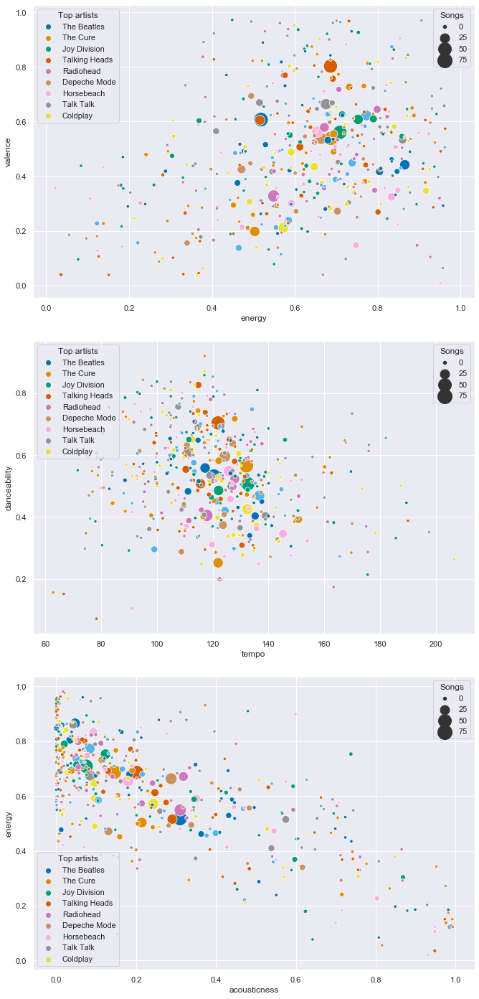

In [66]:
distribution_scatters(traits_df)

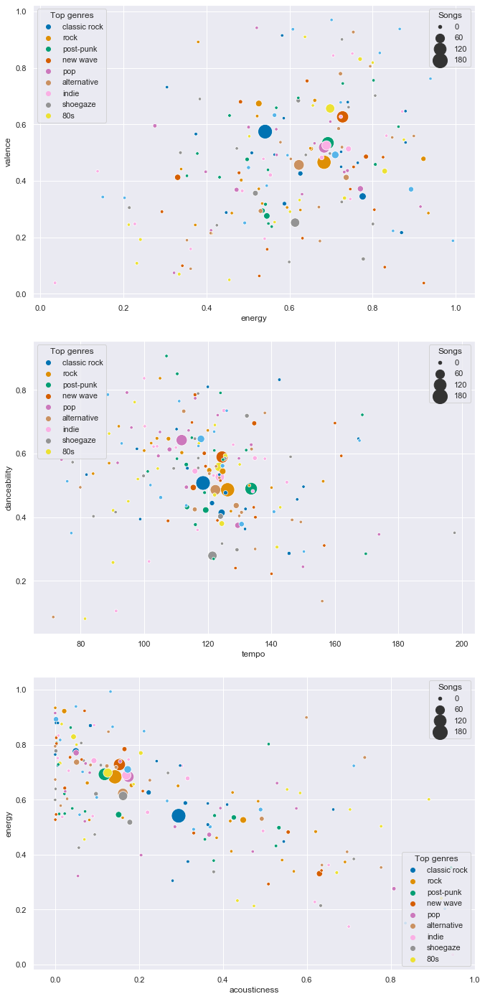

In [67]:
distribution_scatters(traits_with_genres)

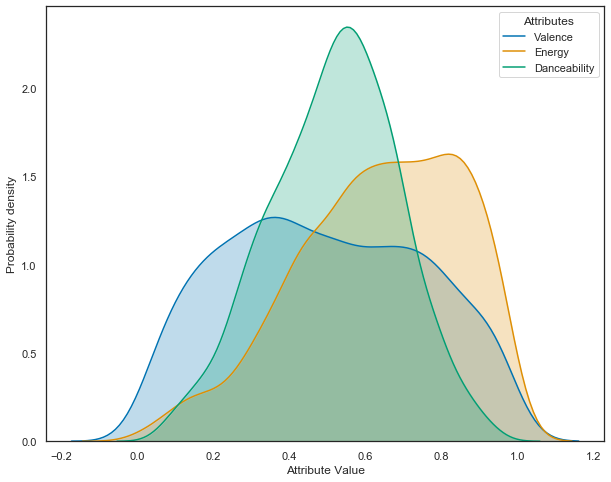

In [68]:
dist_attributes(traits_df)

***
### Part VI: Machine Learning
Here, the possibility of predicting the artist or the genre based on the song attributes will be examined. Training such a model is the final assignment objective.

This part uses the dataframes from _traits_df_ and _traits_with_genres_ to train a classifier, and then see the accuracy score.
***

In [69]:
traits_df.Artist.value_counts()

The Beatles                63
The Cure                   61
Joy Division               60
Talking Heads              59
Radiohead                  44
                           ..
Gnarls Barkley              1
JAY-Z                       1
Prince & The Revolution     1
Ace of Base                 1
Bhoomi                      1
Name: Artist, Length: 448, dtype: int64

In [70]:
traits_with_genres.Genre.value_counts()

classic rock                    176
rock                            166
post-punk                       130
new wave                        120
pop                             102
                               ... 
berro                             1
as seen on TV                     1
bollywood                         1
andina                            1
smiths einfluss hoch tausend      1
Name: Genre, Length: 173, dtype: int64

From the couple of output lines above, it is evident that some target categories from both 'Genre' and 'Artist' are under-represented. So, the dataframe will now be sorted, and then filtered so that only those categories with enough instances are used for the classifier model.

Also some tags are very erratic, but they will be filtered out in the following lines.

In [72]:
#sorting the dataframe by most played artists
traits_ml = traits_df.copy()
traits_ml = traits_ml.assign(freq=traits_ml.groupby('Artist')['Artist'].transform('count'))\
  .sort_values(by=['freq','Artist'],ascending=[False,True])
traits_ml = traits_ml.reset_index(drop = True)
traits_ml = traits_ml[traits_ml.freq>=20]
traits_ml.head()

,Artist,Track,ID,energy,acousticness,valence,danceability,tempo,freq
0,The Beatles,Sgt. Pepper's Lonely Hearts Club Band,4fUKE8EULjQdHF4zb0M8FO,0.673,0.08570,0.583,0.451,95.513,63
1,The Beatles,While My Guitar Gently Weeps,389QX9Q1eUOEZ19vtzzI9O,0.654,0.02050,0.702,0.453,115.000,63
2,The Beatles,Sun King,4nwKdZID1ht0lDBJ5h2p87,0.177,0.28400,0.192,0.483,74.994,63
3,The Beatles,Polythene Pam,1FTCA6wQwulQFokDddKE68,0.939,0.00472,0.499,0.474,166.829,63
4,The Beatles,She Came in Through the Bathroom Window,2jtUGFsqanQ82zqDlhiKIp,0.720,0.00376,0.690,0.530,80.652,63


In [74]:
#sorting the dataframe by most played genres
genres_ml = traits_with_genres.copy()
genres_ml = genres_ml.assign(freq=genres_ml.groupby('Genre')['Genre'].transform('count'))\
  .sort_values(by=['freq','Genre'],ascending=[False,True])
genres_ml = genres_ml.reset_index(drop = True)
genres_ml = genres_ml[genres_ml.freq>50]
genres_ml.head()

,Artist,Track,ID,energy,acousticness,valence,danceability,tempo,Genre,freq
0,Styx,Man In The Wilderness,0hxHatHRsTDFNZ2Ruw47n3,0.519,0.0393,0.308,0.263,138.340,classic rock,176
1,The Velvet Underground,Oh! Sweet Nuthin',0i19MAZbyn8uTir7FprXId,0.467,0.3030,0.525,0.399,75.601,classic rock,176
2,Billy Joel,Movin' Out (Anthony's Song),16GUMo6u3D2qo9a19AkYct,0.880,0.4650,0.895,0.664,133.898,classic rock,176
3,Styx,Snowblind,7rcKKQTJLSno5RRDXbskGN,0.368,0.0819,0.181,0.246,71.376,classic rock,176
4,The Beatles,Sgt. Pepper's Lonely Hearts Club Band,4fUKE8EULjQdHF4zb0M8FO,0.673,0.0857,0.583,0.451,95.513,classic rock,176


Clearly, a lot of data instances were filtered out. This was done to narrow down the target labels so that the classifier accuracy results were acceptable. With a larger dataset, where all target labels are equally represented, such filtering will not be necessary.

Now, all the necessary libraries are imported

In [75]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import preprocessing

#classifier models
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import GaussianNB

#from imblearn.over_sampling import RandomOverSampler

All the classifiers were trained using the filtered data.

In [76]:
def prediction_accuracy(df, model):
    
    features = ['energy', 'acousticness', 'valence', 'danceability', 'tempo']
    target_1 = ['Artist']
    target_2 = ['Genre']
    
    if 'Genre' in df.columns:
        X = df[features]     #track features
        y = df[target_2]     #target genres
    else:
        X = df[features]    #track features
        y = df[target_1]    #target artists
    
    if model == 1:
        classifier = MLPClassifier(solver='lbfgs', max_iter = 2000, alpha=1e-5, hidden_layer_sizes=(10, 2), random_state=1)
    if model == 2:
        classifier = LinearSVC(max_iter = 2000)
    if model == 3:
        classifier = DecisionTreeClassifier(max_leaf_nodes=10000, random_state=999)
    if model == 4:
        classifier = KNeighborsClassifier()
    if model == 5:
        classifier = GaussianNB()
    if model == 6:
        classifier = RandomForestClassifier(n_estimators=1000)
    if model == 7:
        classifier = BaggingClassifier(KNeighborsClassifier(),\
                                            max_samples=0.5, max_features=0.5)
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=324)
    
#     sampler = RandomOverSampler(random_state = 0)
#     X_resampled, y_resampled = sampler.fit_resample(X_train, y_train.values.ravel())
#     classifier.fit(X_resampled, y_resampled)
    
    scaler = preprocessing.StandardScaler().fit(X_train)
    X_processed_train = scaler.transform(X_train)
    X_processed_test = scaler.transform(X_test)
    
    classifier.fit(X_processed_train, y_train.values.ravel())
    y_pred = classifier.predict(X_processed_test)
    
#     classifier.fit(X_train, y_train.values.ravel())
#     y_pred = classifier.predict(X_test)
    
    return accuracy_score(y_test, y_pred)

After testing the various classifiers, the following models were found relatively more reliable than the others:
* Random forest classifier for predicting the artists
* Linear SVC for predicting the genres

In [77]:
#accuracy of predicting artists based on track features
prediction_accuracy(traits_ml,6)

0.3409090909090909

In [78]:
#accuracy of predicting genre based on track features
prediction_accuracy(genres_ml,2)

0.3128834355828221

### End of Notebook